In [1]:
import os 
import sys
import pandas as pd 
import numpy as np 

import plotly.graph_objects as go 

OR_LEARNING_PATH = os.path.join(os.getcwd().split('OR_learning')[0], 'OR_learning/')
sys.path.insert(0, os.path.join(OR_LEARNING_PATH, 'utils/'))

import BindingCavity_functions as bc 
import SequenceAlignment_functions as sa
import plot_functions as pf
import color_function as cf 
import pdb_functions as pu
import voxel_functions as vf

In [2]:
import importlib 

importlib.reload(bc)
importlib.reload(pf)
importlib.reload(sa)
importlib.reload(pu)
importlib.reload(vf)
importlib.reload(cf)

<module 'color_function' from '/mnt/data2/Justice/OR_learning/utils/color_function.py'>

### Spatial encoding
encode pdb coordinates into voxels in with features in a meaningful way 

- Currently the protein structure / cavity PCA doesn’t cluster well or robust. Likely due to coordinate too specific. As each atom is represented as a single coordinate value in a voxel. which in reality they should be occupying a ‘space’. Address this by assigning each atom a designated radius in voxel according to it's atomic properties. 
- Instead of amino acid feature which are likely not descriptive. Try embedding ESM residues for specific sequence individually instead. 
- Since PCA requires linear vector, which causes voxels losing spatial geometry. Try 3D pooling of voxels then PCA 

#### Generate cavity coordinates 

In [ ]:
"""
Run via bc_cav_dump.py to generate pyKVFinder binding cavity coordinates
"""

# base_dir = "/mnt/data2/Justice/AF_files/AF_tmaligned_pdb/"
# pdb_files = [os.path.join(base_dir, sub_dir) for sub_dir in os.listdir(base_dir)] 

# # Run pyKVFinder and Filter 
# bc_cav_coords, bc_cavsurf_coords, bc_res_coords = bc.run_pyKVFinder_workflow(pdb_files,
#                                                                     cavity_identity=True)

# # Save dict as pkl 
# import pickle 
# with open('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_bc_pyKVcav_tmaligned.pkl', 'wb') as f:
#     pickle.dump(bc_cav_coords, f)
# with open('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_bc_pyKVcavsurf_tmaligned.pkl', 'wb') as f:
#     pickle.dump(bc_cavsurf_coords, f)
# with open('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_bc_pyKVres_tmaligned.pkl', 'wb') as f:
#     pickle.dump(bc_res_coords, f)

#### Filter cavity and residues by canonical binding cavity

In [3]:
cav_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_bc_pyKVcav_tmaligned.pkl')
res_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_bc_pyKVres_tmaligned.pkl')

In [ ]:
"""
Re-Filtering the cavity and residue by the cavity that overlaps with canonical_bc_coords

canonical_bc_coords is previously defined via AF3 structure overlapping cavity with residues inside. 
See bc_AF3_CBC.ipynb

"""

canonical_bc_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/canonical_bc_coords.pkl')

Cbc_cav_coords = {}
Cbc_res_coords = {}
for _OR in cav_coords: 
    Cbc_cav_coords[_OR], Cbc_res_coords[_OR] = bc.filter_coordinates_within_cavity(canonical_bc_coords, 
                                                                     cav_coords[_OR], 
                                                                     res_coords[_OR], 
                                                                     filter_cutoff=0.3)

# Remove Olfr entries with no detected cavity / residue after filtering
empty_olfr = [_olfr for _olfr in Cbc_cav_coords if len(Cbc_cav_coords[_olfr]) == 0]
for _olfr in empty_olfr: 
    del Cbc_cav_coords[_olfr]
    del Cbc_res_coords[_olfr]
    
# Filter by DL_OR only ORs
Olfr_DL = np.load('/mnt/data2/Justice/OR_learning/files/Olfr_DL.npy', allow_pickle=True).item()

Cbc_cav_coords = {Olfr_DL.get(_olfr.split('_')[0]): _value for _olfr, _value in Cbc_cav_coords.items() if Olfr_DL.get(_olfr.split('_')[0])}
Cbc_res_coords = {Olfr_DL.get(_olfr.split('_')[0]): _value for _olfr, _value in Cbc_res_coords.items() if Olfr_DL.get(_olfr.split('_')[0])}

import pickle 
with open('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_cav_coords.pkl', 'wb') as f:
    pickle.dump(Cbc_cav_coords, f)
with open('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_res_coords.pkl', 'wb') as f:
    pickle.dump(Cbc_res_coords, f)


In [ ]:
# Quick visualization of the overlap between Cbc and one cavity coordinates
pf.plot_coordinates([canonical_bc_coords, 
                     Cbc_cav_coords[list(Cbc_cav_coords)[0]], 
                     Cbc_res_coords[list(Cbc_res_coords)[0]][:,3:6]], 
                    opacity = 0.3)

### Spatial amino acid OHE

#### aa properties voxels pooling PCA 

In [5]:
"""
Voxelize cavity and residue coordinates into voxel format
"""
Cbc_cav_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_cav_coords.pkl')
Cbc_res_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_res_coords.pkl')

Cbc_voxels, _ = vf.voxelize_cavity(cavity_coords = Cbc_cav_coords,
                                   residue_coords = Cbc_res_coords,
                                   resolution = 1, 
                                   encode_method='ohe', 
                                   vdw_radius = True)

Encoding voxels via ohe...
Generating voxels. . .


100%|██████████| 1057/1057 [02:16<00:00,  7.74it/s]


In [ ]:
# Quickly visualize voxelized features
fig = pf.visualize_voxel_grid([Cbc_voxels[0]], 
                        voxel_type = '4D', 
                        # labels = ['original', 'gaussian_blurred'], 
                        opacity = 0.5,
                        property_indices=[ 0,1,2,3,4,5,6],
                        colormap=cf.distinct_colors(num_colors=10)
                        )
# fig.add_traces()
fig.show()

In [ ]:
from sklearn.decomposition import PCA

pooled_vectors = []
for _voxel in Cbc_voxels:
    # Convert to PyTorch tensor: shape (1, features, X, Y, Z)
    voxel_torch = _voxel.permute(3, 0, 1, 2).unsqueeze(0)    
    
    # Apply average pooling
    pooled = F.avg_pool3d(voxel_torch, kernel_size=4, stride=4)  # Adjust kernel/stride as needed

    # Convert back: (1, 1280, X', Y', Z') → (X', Y', Z', 1280)
    pooled_np = pooled.squeeze(0).permute(1, 2, 3, 0).numpy()

    # Flatten 3D spatial + features into 1D vector
    pooled_vector = pooled_np.reshape(-1)  # shape: (X'*Y'*Z'*1280,)
    pooled_vectors.append(pooled_vector)

# Stack all pooled vectors: shape = (N, flattened dimension)
X = np.stack(pooled_vectors)

# Run PCA
pca = PCA(n_components=2)  # Or 3 for 3D plotting
X_pca = pca.fit_transform(X)
variance_ratio = pca.explained_variance_ratio_

pca_df = pd.DataFrame(X_pca, 
                      index = list(Cbc_cav_coords),
                      columns=['PCA_1', 'PCA_2'])


pca_df.to_csv('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/pca_df.csv')

In [ ]:
import plotly.graph_objects as go 
import re

# Visualize pca 

# Extract OR class from index
OR_family = [re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else 'None' for _OR in pca_df.index]

# Define Class I and Class II based on OR number ranges
Class_I_df = pca_df.loc[[_OR for _OR, cls in zip(pca_df.index, OR_family) if cls in map(str, range(51, 57))]]
Class_II_df = pca_df.loc[[_OR for _OR, cls in zip(pca_df.index, OR_family) if cls in map(str, range(1, 15))]]


# Define colors for each class
colormap = cf.distinct_colors(['Class_I', 'Class_II'])

# Plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=Class_I_df.iloc[:, 0],  # First dimension
    y=Class_I_df.iloc[:, 1],  # Second dimension
    text=Class_I_df.index,    # Labels
    mode='markers',
    name='Class_I',
    marker=dict(
        color=colormap['Class_I'],
        size = 8, opacity=0.6
    )
))

fig.add_trace(go.Scatter(
    x=Class_II_df.iloc[:, 0],
    y=Class_II_df.iloc[:, 1],
    text=Class_II_df.index,
    mode='markers',
    name='Class_II',
    marker=dict(
        color=colormap['Class_II'],
        size = 8, opacity=0.6
    )
))


fig.update_traces( marker=dict(size=7, opacity = 0.8))
fig.update_layout(xaxis_title = f'PC1 ({variance_ratio[0]*100:.2f}%)',
                  yaxis_title = f'PC2 ({variance_ratio[1]*100:.2f}%)',
                  margin=dict(r=10, l=10, b=10, t=10),
                  plot_bgcolor='white',  # set the plot background color to white
                  paper_bgcolor='white',  # set the paper background color to white
)
fig.show()
# fig.write_html('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/PCA_pool3d_Cbc_aa_properties_class.html')

In [ ]:
import plotly.graph_objects as go 

# Visualize pca 
OR_name = list(pca_df.index)

# Extract OR class from index
index_family = pd.Series(re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None for _OR in pca_df.index)

# Define colors for each class
# index_family = index_family[index_family != 'None']
colormap = cf.distinct_colors(np.unique(index_family), category='tab20')

# Plot
fig = go.Figure()

for _family in np.sort(np.unique(index_family).astype(int)): 
    subset = pca_df.reset_index(names='OR')[index_family == str(_family)]
    
    fig.add_trace(go.Scatter(
        x=subset['PCA_1'],  # First dimension
        y=subset['PCA_2'],  # Second dimension
        text=subset['OR'],    # Labels
        mode='markers',
        name= f'family {str(_family)}',
        marker=dict(
            color=colormap[str(_family)],
            size = 8, opacity=0.6
        )
    ))


fig.update_traces( marker=dict(size=7, opacity = 0.8))
fig.update_layout(xaxis_title = f'PC1 ({variance_ratio[0]*100:.2f}%)',
                  yaxis_title = f'PC2 ({variance_ratio[1]*100:.2f}%)',
                  margin=dict(r=10, l=10, b=10, t=10),
                  plot_bgcolor='white',  # set the plot background color to white
                  paper_bgcolor='white',  # set the paper background color to white
)
fig.show()
# fig.write_html('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/PCA_pool3d_Cbc_aa_properties_family.html')


#### PCA euclidean distance

In [8]:
"""
Reads in pca df quickly sort by class and family 
"""
pca_df = pd.read_csv('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/pca_df.csv', index_col = 0)

# Extract the family and subfamily numbers using regex
class_family = pca_df.index.str.extract(r'Or(\d+)([a-zA-Z]+)(\d+)')
class_family[0] = class_family[0].astype(int)
# Convert to numeric (missing subfamilies become NaN, fill with 0 or -1)
# class_family = class_family.fillna(-1).astype(int)

# Assign as temporary columns for sorting
pca_df['class'] = class_family[0].values
pca_df['letters'] = class_family[1].values
pca_df['family'] = class_family[2].values

pca_df = pca_df.sort_values(['class', 'letters', 'family'])
pca_df = pca_df.drop(columns = ['class', 'letters', 'family'])

In [13]:
# Calculates the pairwise euclidean distances based on PCA 

from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_scaled = scaler.fit_transform(pca_df)

euclid_dist = pf.compute_pairwise_pca_distance(pd.DataFrame(X_scaled, index=pca_df.index), 
                                 zscore=True, 
                                 colnames = ['OR1', 'OR2', 'SpatialaaOHE_euclid_zscore'])


In [61]:
# === MDS Grantham distance === 
mds_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/Canonical_bc/SeqAlignment/SeqAlignment_Full_grantham_dist_mtx.csv', index_col = 0)
#Reindex based on pca_df 
mds_df = mds_df[pca_df.index].loc[pca_df.index]
i, j = np.triu_indices_from(mds_df, k=1)

mds_dist = mds_df.values[i, j]
mds_zscore = (mds_dist - np.mean(mds_dist)) / np.std(mds_dist)
mds_distance = pd.DataFrame({
    "OR1": mds_df.index[i],
    "OR2": mds_df.columns[j],
    "Grantham_Distance": mds_zscore, 
})

# === Join dataframe === 
distance_df = pd.merge(euclid_dist, mds_distance, on = ['OR1', 'OR2'], how='left')

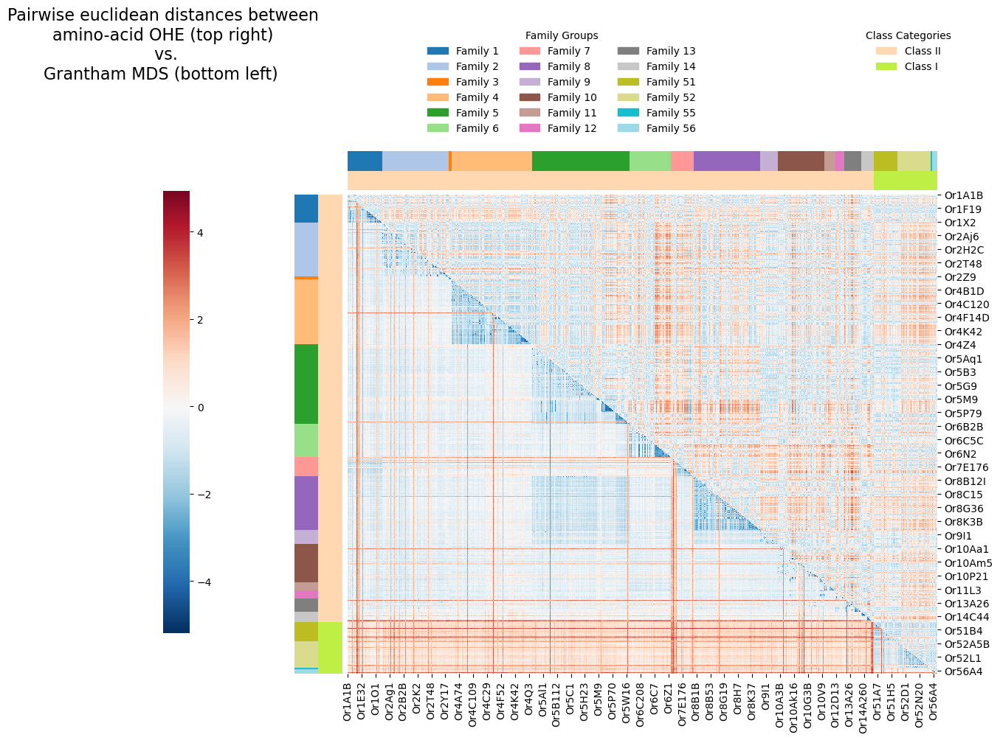

In [ ]:
import matplotlib.pyplot as plt 
import seaborn as sns 
import matplotlib.patches as mpatches
from scipy.spatial.distance import squareform


# Join ESM and MDS zscore togetehr
mask_upper = np.triu(squareform(distance_df['SpatialaaOHE_euclid_zscore']), k=1).astype(bool)
mask_lower = np.tril(squareform(distance_df['Grantham_Distance']), k=-1).astype(bool)

plot_df = pd.DataFrame(np.zeros_like(squareform(distance_df['SpatialaaOHE_euclid_zscore'])), 
                       index=pca_df.index, 
                       columns=pca_df.index)
plot_df.values[mask_upper] = pd.DataFrame(squareform(distance_df['SpatialaaOHE_euclid_zscore'])).values[mask_upper]
plot_df.values[mask_lower] = pd.DataFrame(squareform(distance_df['Grantham_Distance'])).values[mask_lower]

plot_df_index = pd.Series((re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None) 
                          for _OR in plot_df.index).astype(int)


# Assign cluster colors based on family 
colors = cf.distinct_colors(plot_df_index.unique(), 
                                category='tab20')
colors = {_key: _color.upper() for _key, _color in colors.items()}
index_colors = plot_df_index.map(colors)
index_colors = [ _color.upper() for _color in index_colors]
# Assign secondary colors based on class
class_colors = sns.cubehelix_palette(2,light=.7, dark=.5, start=1, rot=3)
index_colors_class = ['#ffd8b1' if _index in range(1,15) else '#bfef45' for _index in plot_df_index]


# Create family/class name mappings for the legend
family_names = {family_id: f"Family {family_id}" for family_id in plot_df_index.unique()}
class_names = {
    '#ffd8b1': 'Class II',
    '#bfef45': 'Class I'
}

# Plot the heatmap
g = sns.clustermap(plot_df, 
               cmap = 'RdBu_r',
               center = 0, 
               cbar_pos = (0.05, 0.15, 0.03, 0.6), 
               row_colors = [index_colors, index_colors_class], 
               col_colors = [index_colors, index_colors_class],
               row_cluster = False, 
               col_cluster = False,
               figsize=(12, 10)  # Adjust figure size to accommodate legends
               )

# Add legends for the family colors
family_handles = [mpatches.Patch(color=color, label=family_names[family_id]) 
                 for family_id, color in colors.items()]
class_handles = [mpatches.Patch(color=color, label=name) 
                 for color, name in class_names.items()]

# Position the legends
# Family legend - on top left corner
family_legend = g.fig.legend(handles=family_handles, 
                            title="Family Groups",
                            loc="upper center", 
                            bbox_to_anchor=(0.5, 0.98), 
                            frameon=False,
                            ncol=3)  # Adjust number of columns as needed

# Class legend - on top right corner
class_legend = g.fig.legend(handles=class_handles, 
                           title="Class Categories",
                           loc="upper right", 
                           frameon=False,
                           bbox_to_anchor=(0.95, 0.98))

# Add a title for the entire plot
plt.suptitle("Pairwise euclidean distances between\namino-acid OHE (top right)\n vs.\nGrantham MDS (bottom left) ", 
             fontsize=16, x= 0.05, y=1)
g.savefig('../../output/Canonical_bc/spatial_encoding/aaOHE/Heatmap_SpatialaaOHEvsGrantham.png')


### Spatial aa OHE ligand response 

In [ ]:
# Load pS6-IP data 
ps6_df = pd.read_csv('/mnt/data2/Justice/OR_learning/files/pS6IP/pS6IP_MASTER_HL_Annotated_2025.csv', index_col = 0)
ps6_df = ps6_df[['DL_OR', 'cid', 'odor', 'concentration', 'odor_and_conc', 'odor_category', 'logFC', 'FDR', 'logFC_adj_zscore']]
# Subset for concentration in percentages 
ps6_df = ps6_df[ps6_df.concentration.str.contains('p')]
# Quick sort to make plots group by odor category etc. 
ps6_df = ps6_df.sort_values(['odor_category', 'odor', 'concentration', 'FDR', 'logFC_adj_zscore'])

In [99]:
from sklearn.preprocessing import StandardScaler

pca_df = pd.read_csv('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/pca_df.csv', index_col = 0)

# Calculates the pairwise euclidean distances based on PCA 
scaler = StandardScaler()
X_scaled = scaler.fit_transform(pca_df)
euclid_dist = pf.compute_pairwise_pca_distance(pd.DataFrame(X_scaled, index=pca_df.index), 
                                 zscore=True, 
                                 colnames = ['OR1', 'OR2', 'SpatialaaOHE_euclid_zscore'])



In [102]:
import random

std_cutoff = 2

# Violin plot to show euclidean distance between OR responding to the same ligands via pS6
fig = go.Figure()

# Randomly sample same number of comparisons for shuffled control
# OR_mask = random.sample(list(ps6_df.DL_OR.unique()), 50)
# shuffled_data = svd_distance[(svd_distance.OR1.isin(OR_mask)) &
#                              (svd_distance.OR2.isin(OR_mask))]
shuffled_data = euclid_dist.sample(200)

# Shuffled control bar
fig.add_trace(go.Violin(
    x=['Shuffled'] * len(shuffled_data),
    y=shuffled_data['SpatialaaOHE_euclid_zscore'],
    # error_y=dict(type='data', array=[shuffled_data['ESM_Distance'].std()]),
    name='Shuffled',
    marker=dict(color='#D3D3D3', opacity=1),
    # offsetgroup='Shuffled',
    legendgroup='Shuffled',
    showlegend=False
))

# colormap = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
category_colors = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
colormap = {}
for _category in ps6_df.odor_category.unique():     
    colormap.update(cf.generate_faded_shades(category_colors[_category],
                                     list(ps6_df[ps6_df.odor_category == _category].odor.unique())))


for _odor in ps6_df.odor.unique(): 
    
    # Subset: DL_OR comparisons
    # ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
    #                     (ps6_df.FDR < FDR_cutoff) & 
    #                     (ps6_df.logFC > logFC_cutoff)]
    
    ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
                        (ps6_df.logFC_adj_zscore > std_cutoff)]
    
    if len(ps6_subset) <= 2: 
        continue
    
    cid = ps6_subset.cid.unique().astype(str).item()
    odor_group = ps6_subset.odor_category.unique().item()
    # concentration = ps6_subset.concentration.unique().astype(str).item()
    OR_mask = ps6_subset.DL_OR
    
    odor_data = euclid_dist[(euclid_dist.OR1.isin(OR_mask)) &
                            (euclid_dist.OR2.isin(OR_mask))]
    
    fig.add_trace(go.Violin(
        x=[_odor] * len(odor_data),
        y=odor_data['SpatialaaOHE_euclid_zscore'].values,
        name=f'{_odor} ({cid})',
        # mode = 'markers', 
        marker=dict(color=colormap[_odor],
                    opacity=0.5),
        # offsetgroup=concentration,
        legendgroup=cid,
        showlegend=False
    ))
    
fig.update_traces(meanline_visible=True)
fig = pf.add_p_value_annotation(fig, 
                                [[i,i] for i in range(len(fig.data))], 
                                test_type='ttest_1samp', popmean = 0,  
                                include_tstat=True, 
                                y_padding=False, 
                                font_size=10,
                                show='symbol',
                                p_round=2, 
                                _format=dict(interline=0.07, text_height=1, color='black'))

fig.add_hline(y=0, line_width=3, line_dash="dash", line_color="#D3D3D3", opacity = 1)

fig.update_layout(
    title="aaOHE PCA pairwise euclidean distance for pS6-IP odor responding ORs <br><sup>ttest_1samp against mean=0",
    yaxis_title="aaOHE pairwise euclidean distance z-scored",
    xaxis_title="",
    barmode='group')

fig.update_layout(template = 'simple_white')
fig.show()
fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/aaOHE/spatialaaOHE_pairwise_odorOR_PCAeuclidzscore.html')

In [105]:
Cbc_voxels[0].shape

torch.Size([43, 41, 42, 21])

### spatial ESM encoding

#### ESM pooling PCA 

In [4]:
res_esm = np.load('/mnt/data2/Justice/OR_learning/files/ESM/residue_embeddings.npy', 
                  allow_pickle=True)
OR_label = np.load('/mnt/data2/Justice/OR_learning/files/ESM/esm_OR_order.npy', 
                 allow_pickle=True)

# Join OR label and ESM 
OR_esm = {str(_OR): res_esm[i] for i, _OR in enumerate(OR_label)}

In [5]:
Cbc_cav_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_cav_coords.pkl')
Cbc_res_coords = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/binding_cavity/dict_Cbc_res_coords.pkl')

In [ ]:
"""
Voxelize cavity and residue coordinates into voxel format
"""

from tqdm import tqdm 

sparse_voxels, grid_shape = vf.voxelize_cavity(cavity_coords = Cbc_cav_coords,
                                      residue_coords = Cbc_res_coords,
                                      resolution = 1, 
                                      encode_method='esm', 
                                      OR_esm = OR_esm, 
                                      esm_order = list(Cbc_cav_coords), 
                                      vdw_radius = True, 
                                      sparse_mode = True)

print(f'Grid shape: {grid_shape}')


Grid shape: [43 41 42]


In [ ]:
import torch 

all_pooled = []
for sparse_vox in tqdm(sparse_voxels):  # assume you saved grid_shapes
    pooled = vf.sparse_avg_pool3d(sparse_vox, grid_shape, kernel_size=4, stride=4)
    all_pooled.append(pooled.flatten())  # flatten 3D → 1D vector per structure


100%|██████████| 1057/1057 [01:03<00:00, 16.66it/s]


Text(0, 0.5, 'Cumulative Explained Variance')

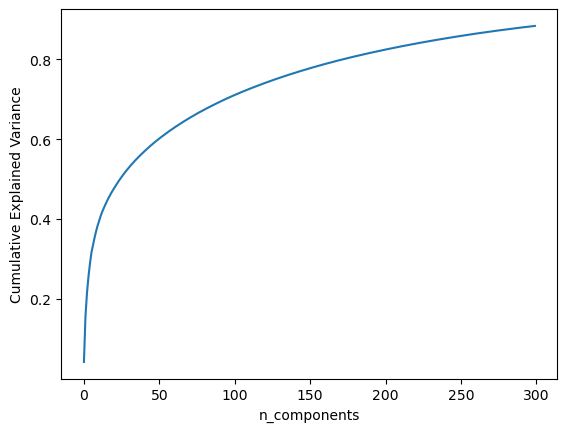

In [ ]:
from sklearn.decomposition import TruncatedSVD

# Stack pooled features into a matrix of shape (n_structures, pooled_dim)
X = torch.stack(all_pooled)  # Shape: (n_structures, pooled_dim)

# Identify columns that are constant across all proteins (e.g., always zero)
mask = X.std(dim=0) > 0  # Exclude dimensions with no atoms across structures

# Apply the mask to reduce dimensionality
X_filtered = X[:, mask]  # shape: (N, D_reduced)

svd = TruncatedSVD(n_components=300)  # or any k << 879360
X_reduced = svd.fit_transform(X.numpy())  # If using torch
variance_ratio = svd.explained_variance_ratio_

# Save file 
svd_df = pd.DataFrame(X_reduced, 
             index = list(Cbc_cav_coords))

# Reorder index based on family 
import re
svd_df['family'] = pd.Series((re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None) for _OR in svd_df.index).astype(int).to_list()
svd_df = (svd_df.assign(index_col=svd_df.index)
          .sort_values(by=['family', 'index_col'])
          .drop(columns=['index_col', 'family']))
svd_df.to_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD.csv') 

import matplotlib.pyplot as plt
plt.plot(np.cumsum(svd.explained_variance_ratio_))
plt.xlabel("n_components")
plt.ylabel("Cumulative Explained Variance")

#### SVD Umap 

In [1]:
"""
PACKAGE COMPALIBILITY ISSUE. 

Run under ** conda umap_env ** 
"""

import pandas as pd 
import umap

svd_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD.csv', index_col = 0)
### Step 3: UMAP visualization
umap_embedder = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=2, random_state=0)
X_umap = umap_embedder.fit_transform(svd_df)  # Shape: (1057, 2)

# Save umap coordinates
pd.DataFrame(X_umap, 
             index=svd_df.index, 
             columns=['Umap_1', 'Umap_2']).to_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD_umap.csv')

/home/hl307@dhe.duke.edu/anaconda3/envs/umap_env/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/hl307@dhe.duke.edu/anaconda3/envs/umap_env/lib/python3.10/site-packages/sklearn/utils/deprecation.py:151: FutureWarning: 'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.
  warnings.warn(
/home/hl307@dhe.duke.edu/anaconda3/envs/umap_env/lib/python3.10/site-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


In [3]:
import plotly.graph_objects as go 
import re

svd_umap = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD_umap.csv', 
                       index_col = 0)

# Extract OR class from index
OR_family = [re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else 'None' for _OR in svd_umap.index]

# Define Class I and Class II based on OR number ranges
Class_I_df = svd_umap.loc[[_OR for _OR, cls in zip(svd_umap.index, OR_family) if cls in map(str, range(51, 57))]]
Class_II_df = svd_umap.loc[[_OR for _OR, cls in zip(svd_umap.index, OR_family) if cls in map(str, range(1, 15))]]


# Define colors for each class
colormap = cf.distinct_colors(['Class_I', 'Class_II'])

# Plot
fig = go.Figure()

fig.add_trace(go.Scatter(
    x=Class_I_df.iloc[:, 0],  # First dimension
    y=Class_I_df.iloc[:, 1],  # Second dimension
    text=Class_I_df.index,    # Labels
    mode='markers',
    name='Class_I',
    marker=dict(
        color=colormap['Class_I'],
        size = 8, opacity=0.6
    )
))

fig.add_trace(go.Scatter(
    x=Class_II_df.iloc[:, 0],
    y=Class_II_df.iloc[:, 1],
    text=Class_II_df.index,
    mode='markers',
    name='Class_II',
    marker=dict(
        color=colormap['Class_II'],
        size = 8, opacity=0.6
    )
))


fig.update_traces( marker=dict(size=7, opacity = 0.8))
fig.update_layout(xaxis_title = f'UMAP1',
                  yaxis_title = f'UMAP2',
                  margin=dict(r=10, l=10, b=10, t=10),
                  plot_bgcolor='white',  # set the plot background color to white
                  paper_bgcolor='white',  # set the paper background color to white
)
fig.show()
fig.write_html('../../output/Canonical_bc/spatial_encoding/SVD_esm/Umap_pool3d_Cbc_esm_class.html')

In [31]:
import plotly.graph_objects as go 

# Visualize pca 
OR_name = list(svd_umap.index)

# Extract OR class from index
index_family = pd.Series(re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None for _OR in svd_umap.index)

# Define colors for each class
# index_family = index_family[index_family != 'None']
colormap = cf.distinct_colors(np.unique(index_family), category='tab20')

# Plot
fig = go.Figure()

for _family in np.sort(np.unique(index_family).astype(int)): 
    subset = svd_umap.reset_index(names='OR')[index_family == str(_family)]
    
    fig.add_trace(go.Scatter(
        x=subset['Umap_1'],  # First dimension
        y=subset['Umap_2'],  # Second dimension
        text=subset['OR'],    # Labels
        mode='markers',
        name= f'family {str(_family)}',
        marker=dict(
            color=colormap[str(_family)],
            size = 8, opacity=0.6
        )
    ))


fig.update_traces( marker=dict(size=7, opacity = 0.8))
fig.update_layout(xaxis_title = f'UMAP1',
                  yaxis_title = f'UMAP2',
                  xaxis=dict(showticklabels=False),
                  yaxis=dict(showticklabels=False),
                  margin=dict(r=10, l=10, b=10, t=10),
                  plot_bgcolor='white',  # set the plot background color to white
                  paper_bgcolor='white',  # set the paper background color to white
)

fig.show()
fig.write_html('../../output/Canonical_bc/spatial_encoding/SVD_esm/Umap_pool3d_Cbc_esm_family.html')


#### SVD distance 

In [199]:
svd_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD.csv', index_col = 0)

In [203]:
# Calculates the pairwise euclidean distances based on truncatedSVD 

from sklearn.preprocessing import StandardScaler


scaler = StandardScaler()
X_scaled = scaler.fit_transform(svd_df)

euclid_dist = pf.compute_pairwise_pca_distance(pd.DataFrame(X_scaled, index=svd_df.index), 
                                 zscore=True, 
                                 colnames = ['OR1', 'OR2', 'spatialESMres_euclid_zscore'])


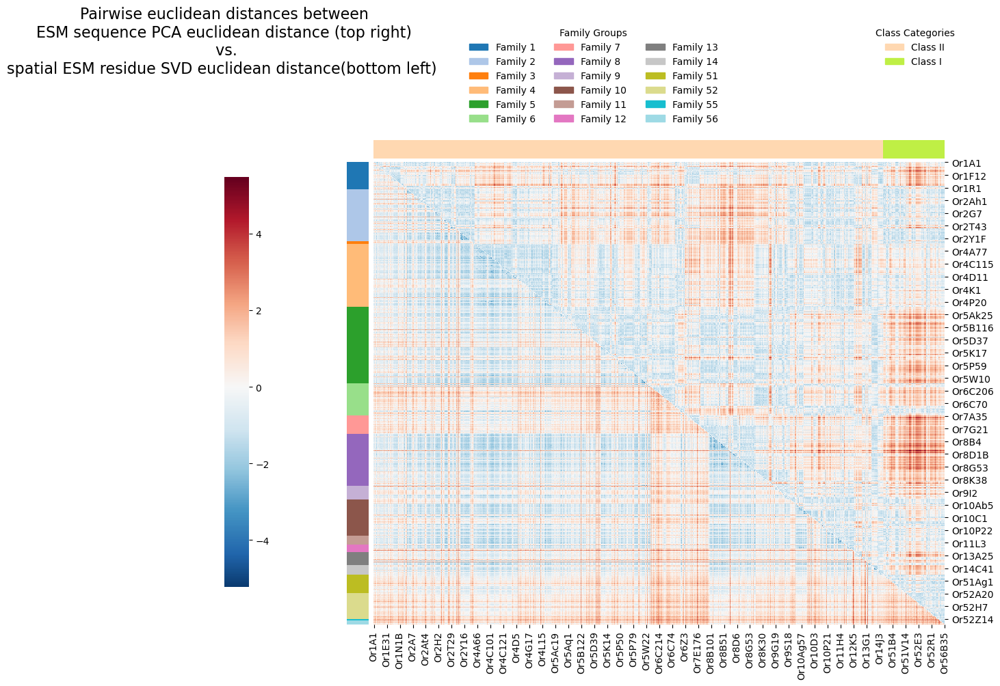

In [213]:
import seaborn as sns 
import matplotlib.patches as mpatches
from scipy.spatial.distance import squareform


# PCA_distance of ESM_sequence. NOT spatial ESM 
pca_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/PCA/pca_esm_coords.csv', index_col = 0) # Quick save for future use
pca_df = pca_df[pca_df.index.isin(svd_df.index)] # Filter by same index as svd_df 
pca_distance = pf.compute_pairwise_pca_distance(pca_df[['PCA_1', 'PCA_2']], 
                                                zscore=True, 
                                                colnames = ['OR1', 'OR2', 'ESMseq_euclid_zscore'])

# Join ESM and MDS zscore togetehr
mask_upper = np.triu(squareform(pca_distance['ESMseq_euclid_zscore']), k=1).astype(bool)
mask_lower = np.tril(squareform(euclid_dist['spatialESMres_euclid_zscore']), k=-1).astype(bool)

plot_df = pd.DataFrame(np.zeros_like(squareform(pca_distance['ESMseq_euclid_zscore'])), 
                       index=pca_df.index, 
                       columns=pca_df.index)
plot_df.values[mask_upper] = pd.DataFrame(squareform(pca_distance['ESMseq_euclid_zscore'])).values[mask_upper]
plot_df.values[mask_lower] = pd.DataFrame(squareform(euclid_dist['spatialESMres_euclid_zscore'])).values[mask_lower]


plot_df_index = pd.Series((re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None) 
                          for _OR in plot_df.index).astype(int)

colors = cf.distinct_colors(plot_df_index.unique(), 
                                category='tab20')
colors = {_key: _color.upper() for _key, _color in colors.items()}
index_colors = plot_df_index.map(colors)
index_colors = [ _color.upper() for _color in index_colors]
# Assign secondary colors based on class
class_colors = sns.cubehelix_palette(2,light=.7, dark=.5, start=1, rot=3)
index_colors_class = ['#ffd8b1' if _index in range(1,15) else '#bfef45' for _index in plot_df_index]


g = sns.clustermap(plot_df, 
               cmap = 'RdBu_r',
               center = plot_df.mean().mean(), 
               cbar_pos = (0.05, 0.15, 0.03, 0.6), 
               row_colors = [index_colors], 
               col_colors = [index_colors_class],
               row_cluster = False, 
               col_cluster = False,
               figsize=(12, 10)  # Adjust figure size to accommodate legends
               )

# Create family/class name mappings for the legend
family_names = {family_id: f"Family {family_id}" for family_id in plot_df_index.unique()}
class_names = {
    '#ffd8b1': 'Class II',
    '#bfef45': 'Class I'
}

# Add legends for the family colors
family_handles = [mpatches.Patch(color=color, label=family_names[family_id]) 
                 for family_id, color in colors.items()]
class_handles = [mpatches.Patch(color=color, label=name) 
                 for color, name in class_names.items()]

# Position the legends
# Family legend - on top left corner
family_legend = g.fig.legend(handles=family_handles, 
                            title="Family Groups",
                            loc="upper center", 
                            bbox_to_anchor=(0.5, 0.98), 
                            frameon=False,
                            ncol=3)  # Adjust number of columns as needed

# Class legend - on top right corner
class_legend = g.fig.legend(handles=class_handles, 
                           title="Class Categories",
                           loc="upper right", 
                           frameon=False,
                           bbox_to_anchor=(0.95, 0.98))

# Add a title for the entire plot
g.fig.suptitle("Pairwise euclidean distances between\nESM sequence PCA euclidean distance (top right)\n vs.\nspatial ESM residue SVD euclidean distance(bottom left) ", 
             fontsize=16, x= 0.05, y=1)

g.figure.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Heapmap_ESMvSpatialESM.png')


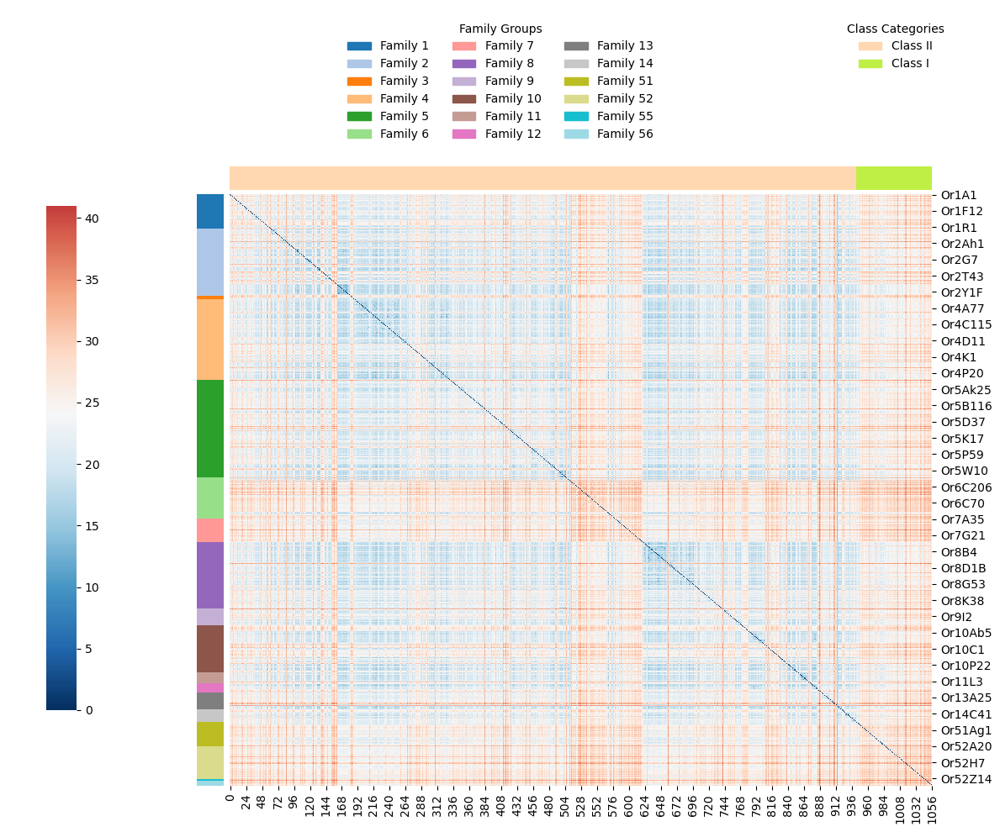

In [ ]:
import seaborn as sns 
import matplotlib.patches as mpatches


# PCA_distance of ESM_sequence. NOT spatial ESM 
pca_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/PCA/pca_esm_coords.csv', index_col = 0) # Quick save for future use
pca_distance = pf.compute_pairwise_pca_distance(pca_df[['PCA_1', 'PCA_2']], 
                                                zscore=True, 
                                                colnames = ['OR1', 'OR2', 'ESM_Distance'])

plot_df = pd.DataFrame(euclid_dist, index = svd_df.index)


plot_df_index = pd.Series((re.match(r'Or(\d+)', _OR).group(1) if re.match(r'Or(\d+)', _OR) else None) 
                          for _OR in plot_df.index).astype(int)

colors = cf.distinct_colors(plot_df_index.unique(), 
                                category='tab20')
colors = {_key: _color.upper() for _key, _color in colors.items()}
index_colors = plot_df_index.map(colors)
index_colors = [ _color.upper() for _color in index_colors]
# Assign secondary colors based on class
class_colors = sns.cubehelix_palette(2,light=.7, dark=.5, start=1, rot=3)
index_colors_class = ['#ffd8b1' if _index in range(1,15) else '#bfef45' for _index in plot_df_index]


g = sns.clustermap(plot_df, 
               cmap = 'RdBu_r',
               center = plot_df.mean().mean(), 
               cbar_pos = (0.05, 0.15, 0.03, 0.6), 
               row_colors = [index_colors], 
               col_colors = [index_colors_class],
               row_cluster = False, 
               col_cluster = False,
               figsize=(12, 10)  # Adjust figure size to accommodate legends
               )

# Create family/class name mappings for the legend
family_names = {family_id: f"Family {family_id}" for family_id in plot_df_index.unique()}
class_names = {
    '#ffd8b1': 'Class II',
    '#bfef45': 'Class I'
}

# Add legends for the family colors
family_handles = [mpatches.Patch(color=color, label=family_names[family_id]) 
                 for family_id, color in colors.items()]
class_handles = [mpatches.Patch(color=color, label=name) 
                 for color, name in class_names.items()]

# Position the legends
# Family legend - on top left corner
family_legend = g.fig.legend(handles=family_handles, 
                            title="Family Groups",
                            loc="upper center", 
                            bbox_to_anchor=(0.5, 0.98), 
                            frameon=False,
                            ncol=3)  # Adjust number of columns as needed

# Class legend - on top right corner
class_legend = g.fig.legend(handles=class_handles, 
                           title="Class Categories",
                           loc="upper right", 
                           frameon=False,
                           bbox_to_anchor=(0.95, 0.98))

g.figure.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Heapmap_Cbc_esm_euclid.png')

### Spatial ESM vs ligand response

In [192]:
# Calculates the pairwise euclidean distances based on truncatedSVD 
svd_df = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD.csv', index_col = 0)

from itertools import combinations
from sklearn.preprocessing import StandardScaler
from scipy.spatial.distance import pdist, squareform, cdist
from scipy.stats import zscore

scaler = StandardScaler()
X_scaled = scaler.fit_transform(svd_df)

# Compute pairwise distances (returns condensed form)
# svd_dist = pdist(X_scaled, metric='euclidean')
# svd_zscore = (svd_dist - np.mean(svd_dist)) / np.std(svd_dist)
or_names = svd_df.index.to_list()
pairs = list(combinations(or_names, 2))  

# Create labeled DataFrame
svd_distance = pd.DataFrame(pairs, columns=['OR1', 'OR2'])
# svd_distance['ESM_euclid'] = pdist(X_scaled, metric='euclidean')
svd_distance['ESM_euclid_zscore'] = zscore(pdist(X_scaled, metric='euclidean'))
svd_distance['ESM_cosine_zscore'] = zscore(pdist(X_scaled, metric='cosine'))

In [203]:
zscore(pdist(X_scaled, metric='cosine'))

array([-7.47964862, -0.72669006, -1.49554331, ..., -1.11608295,
       -0.67924894, -7.70664903], shape=(558096,))

In [4]:
# Load pS6-IP data 
ps6_df = pd.read_csv('/mnt/data2/Justice/OR_learning/files/pS6IP/pS6IP_MASTER_HL_Annotated_2025.csv', index_col = 0)
ps6_df = ps6_df[['DL_OR', 'cid', 'odor', 'concentration', 'odor_and_conc', 'odor_category', 'logFC', 'FDR', 'logFC_adj_zscore']]
# Subset for concentration in percentages 
ps6_df = ps6_df[ps6_df.concentration.str.contains('p')]
# Quick sort to make plots group by odor category etc. 
ps6_df = ps6_df.sort_values(['odor_category', 'odor', 'concentration', 'FDR', 'logFC_adj_zscore'])

#### PCA / Umap Odor Response

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go


svd_umap = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/Cbc_esm_sparse_voxels/Cbc_esm_SparseVox_SVD_umap.csv', 
                       index_col = 0)

logFC_cutoff = 0
FDR_cutoff = 0.1
cols = 4
valid_odor_panels = []

for _odor_and_conc in ps6_df.odor_and_conc.unique():
    ps6_subset = ps6_df[
        (ps6_df.odor_and_conc == _odor_and_conc) &
        (ps6_df.FDR < FDR_cutoff) &
        (ps6_df.logFC > logFC_cutoff)
    ]
    
    if len(ps6_subset) > 2:
        valid_odor_panels.append(_odor_and_conc)

num_valid = len(valid_odor_panels)
rows = -(-num_valid // cols)

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[str(odor) for odor in valid_odor_panels],
)

for i, _odor_and_conc in enumerate(valid_odor_panels):
    row, col = divmod(i, cols)
    row += 1
    col += 1

    ps6_subset = ps6_df[
        (ps6_df.odor_and_conc == _odor_and_conc) &
        (ps6_df.FDR < FDR_cutoff) &
        (ps6_df.logFC > logFC_cutoff)
    ].sort_values("logFC")

    OR_mask = ps6_subset.DL_OR
    logFC_values = ps6_subset.logFC
    FDR_values = ps6_subset.FDR

    odor_OR_df = svd_umap.loc[list(OR_mask)]
    background_df = svd_umap.loc[~svd_umap.index.isin(OR_mask)]

    colormap = cf.get_continuous_colors(logFC_values, colormap="RdBu_r", midpoint=0)
    hover_texts = [
        f"{row.DL_OR}<br>logFC:{row.logFC:.3f}<br>FDR:{row.FDR:.2}"
        for _, row in ps6_subset.iterrows()
    ]

    # Background ORs
    fig.add_trace(go.Scatter(
        x=background_df.iloc[:, 0], 
        y=background_df.iloc[:, 1],
        text=background_df.index,
        mode="markers",
        marker=dict(color="#D3D3D3", size=8, opacity=0.1),
        showlegend=False,
    ), row=row, col=col)

    # Odor-responsive ORs
    fig.add_trace(go.Scatter(
        x=odor_OR_df.iloc[:, 0], 
        y=odor_OR_df.iloc[:, 1],
        text=hover_texts,
        mode="markers",
        marker=dict(color=[colormap[or_name] for or_name in logFC_values.index], 
                    size=8, opacity=0.8),
        showlegend=False,
    ), row=row, col=col)

# Layout
fig.update_layout(
    template="simple_white",
    title="spatial-ESMres_3dpooling SVD Umap Odor Response Facet Plot",
    height=rows * 300, width=cols * 300
)
fig.show()
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Umap_Cbc_esm_odorOR.html')

In [ ]:
from plotly.subplots import make_subplots
import plotly.graph_objects as go

pca_df = pd.read_csv('../../output/Canonical_bc/spatial_encoding/PCA_aa_properties/pca_df.csv', index_col = 0)

logFC_cutoff = 0
FDR_cutoff = 0.1
cols = 4
valid_odor_panels = []
mapping_df = pca_df

ps6_df = ps6_df[ps6_df.DL_OR.isin(pca_df.index)]

for _odor_and_conc in ps6_df.odor_and_conc.unique():
    ps6_subset = ps6_df[
        (ps6_df.odor_and_conc == _odor_and_conc) &
        (ps6_df.FDR < FDR_cutoff) &
        (ps6_df.logFC > logFC_cutoff)
    ]
    
    if len(ps6_subset) > 2:
        valid_odor_panels.append(_odor_and_conc)

num_valid = len(valid_odor_panels)
rows = -(-num_valid // cols)

fig = make_subplots(
    rows=rows, cols=cols,
    subplot_titles=[str(odor) for odor in valid_odor_panels],
)

for i, _odor_and_conc in enumerate(valid_odor_panels):
    row, col = divmod(i, cols)
    row += 1
    col += 1

    ps6_subset = ps6_df[
        (ps6_df.odor_and_conc == _odor_and_conc) &
        (ps6_df.FDR < FDR_cutoff) &
        (ps6_df.logFC > logFC_cutoff)
    ].sort_values("logFC")

    OR_mask = ps6_subset.DL_OR
    logFC_values = ps6_subset.logFC
    FDR_values = ps6_subset.FDR

    odor_OR_df = mapping_df.loc[list(OR_mask)]
    background_df = mapping_df.loc[~mapping_df.index.isin(OR_mask)]

    colormap = cf.get_continuous_colors(logFC_values, colormap="RdBu_r", midpoint=0)
    hover_texts = [
        f"{row.DL_OR}<br>logFC:{row.logFC:.3f}<br>FDR:{row.FDR:.2}"
        for _, row in ps6_subset.iterrows()
    ]

    # Background ORs
    fig.add_trace(go.Scatter(
        x=background_df.iloc[:, 0], 
        y=background_df.iloc[:, 1],
        text=background_df.index,
        mode="markers",
        marker=dict(color="#D3D3D3", size=8, opacity=0.1),
        showlegend=False,
    ), row=row, col=col)

    # Odor-responsive ORs
    fig.add_trace(go.Scatter(
        x=odor_OR_df.iloc[:, 0], 
        y=odor_OR_df.iloc[:, 1],
        text=hover_texts,
        mode="markers",
        marker=dict(color=[colormap[or_name] for or_name in logFC_values.index], 
                    size=8, opacity=0.8),
        showlegend=False,
    ), row=row, col=col)

# Layout
fig.update_layout(
    template="simple_white",
    title="spatial-ESMres_3dpooling PCA Odor Response Facet Plot",
    height=rows * 300, width=cols * 300
)
fig.show()
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/PCA_aa_properties/PCA_Cbc_esm_odorOR.html')

#### Violin pairwise OR SVD distance

In [ ]:
import random

std_cutoff = 3
logFC_cutoff = 1
FDR_cutoff = 0.1


# Bar plot to show ESM euclidean distance between OR responding to the same ligands via pS6
fig = go.Figure()

# Randomly sample same number of comparisons for shuffled control
# OR_mask = random.sample(list(ps6_df.DL_OR.unique()), 50)
# shuffled_data = svd_distance[(svd_distance.OR1.isin(OR_mask)) &
#                              (svd_distance.OR2.isin(OR_mask))]
shuffled_data = svd_distance.sample(200)

# Shuffled control bar
fig.add_trace(go.Violin(
    x=['Shuffled'] * len(shuffled_data),
    y=shuffled_data['ESM_Distance_zscore'],
    # error_y=dict(type='data', array=[shuffled_data['ESM_Distance'].std()]),
    name='Shuffled',
    marker=dict(color='#D3D3D3', opacity=1),
    # offsetgroup='Shuffled',
    legendgroup='Shuffled',
    showlegend=False
))

# colormap = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
category_colors = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
colormap = {}
for _category in ps6_df.odor_category.unique():     
    colormap.update(cf.generate_faded_shades(category_colors[_category],
                                     list(ps6_df[ps6_df.odor_category == _category].odor.unique())))


for _odor in ps6_df.odor.unique(): 
    
    # Subset: DL_OR comparisons
    # ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
    #                     (ps6_df.FDR < FDR_cutoff) & 
    #                     (ps6_df.logFC > logFC_cutoff)]
    
    ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
                        (ps6_df.logFC_adj_zscore > std_cutoff)]
    
    if len(ps6_subset) <= 2: 
        continue
    
    cid = ps6_subset.cid.unique().astype(str).item()
    odor_group = ps6_subset.odor_category.unique().item()
    # concentration = ps6_subset.concentration.unique().astype(str).item()
    OR_mask = ps6_subset.DL_OR
    
    odor_data = svd_distance[(svd_distance.OR1.isin(OR_mask)) &
                            (svd_distance.OR2.isin(OR_mask))]
    
    fig.add_trace(go.Violin(
        x=[_odor] * len(odor_data),
        y=odor_data['ESM_Distance_zscore'].values,
        name=f'{_odor} ({cid})',
        # mode = 'markers', 
        marker=dict(color=colormap[_odor],
                    opacity=0.5),
        # offsetgroup=concentration,
        legendgroup=cid,
        showlegend=False
    ))
    
fig.update_traces(meanline_visible=True)
fig = pf.add_p_value_annotation(fig, 
                                [[i,i] for i in range(len(fig.data))], 
                                test_type='ttest_1samp', popmean = 0,  
                                include_tstat=True, 
                                y_padding=False, 
                                font_size=10,
                                show='symbol',
                                p_round=2, 
                                _format=dict(interline=0.07, text_height=1, color='black'))

fig.add_hline(y=0, line_width=3, line_dash="dash", line_color="#D3D3D3", opacity = 1)

fig.update_layout(
    title="ESM SVD pairwise euclidean distance for pS6-IP odor responding ORs <br><sup>ttest_1samp against mean=0",
    yaxis_title="ESM pairwise euclidean distance z-scored",
    xaxis_title="",
    barmode='group')

fig.update_layout(template = 'simple_white')
fig.show()
fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Cbc_esm_pairwise_odorOR_SVDeuclidzscore.html')

/home/hl307@dhe.duke.edu/anaconda3/envs/structure/lib/python3.13/site-packages/scipy/stats/_stats_py.py:1213: RuntimeWarning:

divide by zero encountered in divide

/home/hl307@dhe.duke.edu/anaconda3/envs/structure/lib/python3.13/site-packages/scipy/stats/_stats_py.py:1213: RuntimeWarning:

invalid value encountered in scalar multiply



In [46]:
import random

std_cutoff = None
logFC_cutoff = 1
FDR_cutoff = 0.1

# Bar plot to show ESM euclidean distance between OR responding to the same ligands via pS6
fig = go.Figure()

# Randomly sample same number of comparisons for shuffled control
# OR_mask = random.sample(list(ps6_df.DL_OR.unique()), 50)
# shuffled_data = svd_distance[(svd_distance.OR1.isin(OR_mask)) &
#                              (svd_distance.OR2.isin(OR_mask))]
shuffled_data = svd_distance.sample(200)

# Shuffled control bar
fig.add_trace(go.Violin(
    x=['Shuffled'] * len(shuffled_data),
    y=shuffled_data['ESM_Distance_zscore'],
    # error_y=dict(type='data', array=[shuffled_data['ESM_Distance'].std()]),
    name='Shuffled',
    marker=dict(color='#D3D3D3', opacity=1),
    # offsetgroup='Shuffled',
    legendgroup='Shuffled',
    showlegend=False
))

# colormap = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
category_colors = cf.distinct_colors(ps6_df.odor_category.unique(), category = 'tab10')
colormap = {}
for _category in ps6_df.odor_category.unique():     
    colormap.update(cf.generate_faded_shades(category_colors[_category],
                                     list(ps6_df[ps6_df.odor_category == _category].odor.unique())))


for _odor in ps6_df.odor.unique(): 
    
    # Subset: DL_OR comparisons
    if std_cutoff: 
        ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
                        (ps6_df.logFC_adj_zscore > std_cutoff)]
    else: 
        ps6_subset = ps6_df[(ps6_df.odor == _odor) & 
                            (ps6_df.FDR < FDR_cutoff) & 
                            (ps6_df.logFC > logFC_cutoff)]
    if len(ps6_subset) <= 2: 
        continue
    
    cid = ps6_subset.cid.unique().astype(str).item()
    odor_group = ps6_subset.odor_category.unique().item()
    # concentration = ps6_subset.concentration.unique().astype(str).item()
    OR_mask = ps6_subset.DL_OR
    
    odor_data = svd_distance[(svd_distance.OR1.isin(OR_mask)) &
                            (svd_distance.OR2.isin(OR_mask))]
    
    fig.add_trace(go.Violin(
        x=[_odor] * len(odor_data),
        y=odor_data['ESM_Distance_zscore'].values,
        name=f'{_odor} ({cid})',
        # mode = 'markers', 
        marker=dict(color=colormap[_odor],
                    opacity=0.5),
        # offsetgroup=concentration,
        legendgroup=cid,
        showlegend=False
    ))
    
fig.update_traces(meanline_visible=True)
fig = pf.add_p_value_annotation(fig, 
                                [[i,i] for i in range(len(fig.data))], 
                                test_type='ttest_1samp', popmean = 0,  
                                include_tstat=True, 
                                y_padding=False, 
                                font_size=10,
                                show='symbol',
                                p_round=2, 
                                _format=dict(interline=0.07, text_height=1, color='black'))

fig.add_hline(y=0, line_width=3, line_dash="dash", line_color="#D3D3D3", opacity = 1)

fig.update_layout(
    title=f"spatial ESM SVD pairwise euclidean distance for pS6-IP odor responding ORs <br><sup>ttest_1samp against mean=0, logFC_adj_zscore > {std_cutoff}" if std_cutoff else 
    f"spatial ESM SVD pairwise euclidean distance for pS6-IP odor responding ORs <br><sup>ttest_1samp against mean=0, logFC > {logFC_cutoff}, FDR < {FDR_cutoff}",
    yaxis_title="spatial ESM pairwise euclidean distance z-scored",
    xaxis_title="",
    barmode='group')

fig.update_layout(template = 'simple_white')
fig.show()
fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Cbc_esm_pairwise_odorOR_SVDeuclidzscore.html')
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/Cbc_esm_pairwise_odorOR_SVDeuclidzscore2.html')

#### spatial ESM and Odor Response correlation

In [190]:
ps6_df = pd.read_csv('/mnt/data2/Justice/OR_learning/files/pS6IP/pS6IP_MASTER_HL_Annotated_2025.csv', index_col = 0)
ps6_df = ps6_df[['DL_OR', 'cid', 'odor', 'concentration', 'odor_and_conc', 'odor_category', 'logFC', 'FDR', 'logFC_adj_zscore']]
# Subset for concentration in percentages 
ps6_df = ps6_df[ps6_df.concentration.str.contains('p')]
# Quick sort to make plots group by odor category etc. 
ps6_df = ps6_df[['DL_OR', 'odor_and_conc', 'logFC_adj_zscore']].dropna()

In [193]:
# Make total pS6-ip response difference bewteen ORs

from scipy.stats import zscore

# Pairwise response differense 
pivot_df = ps6_df.pivot(index='odor_and_conc', columns='DL_OR', values='logFC_adj_zscore')
pivot_df = pivot_df.apply(pd.to_numeric).T
pivot_df = pivot_df.loc[svd_df.index] # Filter by index svd_df contains 

# Create pairwise combinations
pairs = list(combinations(pivot_df.index.tolist(), 2))

# Compute distance matrices
result_df = pd.DataFrame(pairs, columns=['OR1', 'OR2'])
result_df['ps6_euclidean_zscore'] = zscore(pdist(pivot_df, metric='euclidean'))
result_df['ps6_cosine_zscore'] = zscore(pdist(pivot_df, metric='cosine'))
result_df['ps6_correlation_zscore'] = zscore(pdist(pivot_df, metric='correlation'))

# Merge with ESM svd euclidean distance df
svd_distance = svd_distance.merge(result_df, on=['OR1', 'OR2'], how='left')

# Get PCA from Full sequence embedding 
pca_full = pd.read_csv('/mnt/data2/Justice/OR_learning/output/ESM/PCA/pca_esm_coords.csv', index_col = 0)
pca_full = pca_full[pca_full.index.isin(svd_df.index)] # Ensure the same ORs. 
svd_distance['ESM_full_pca_zscore'] = zscore(pdist(pca_full[['PCA_1', 'PCA_2']], metric='euclidean'))

In [194]:
# Make pairwise logFC_adj difference between ORs within single odor

from scipy.spatial.distance import pdist
from itertools import combinations
from tqdm import tqdm 

results = []

OR_pairs = list(combinations(pivot_df.index.to_numpy(), 2))
    
for odor in tqdm(pivot_df.columns):
    values = pivot_df[odor].values  # shape: (n_receptors,)
    
    # Compute all pairwise differences (r_i - r_j)
    diffs = pdist(values[:, None], metric='euclidean')  # this gives absolute differences
    signed_diffs = pdist(values[:, None], metric=lambda u, v: u[0] - v[0])  # preserves sign

    results.append(diffs)

# Make pair difference dataframe
odor_diff_df = pd.DataFrame(pairs, columns = ['OR1', 'OR2'])
for i, _odor in enumerate(pivot_df.columns): 
    odor_diff_df[_odor] = results[i]

# Combine to svd_distance df 
svd_distance = svd_distance.merge(odor_diff_df, on=['OR1', 'OR2'])

100%|██████████| 65/65 [00:40<00:00,  1.62it/s]


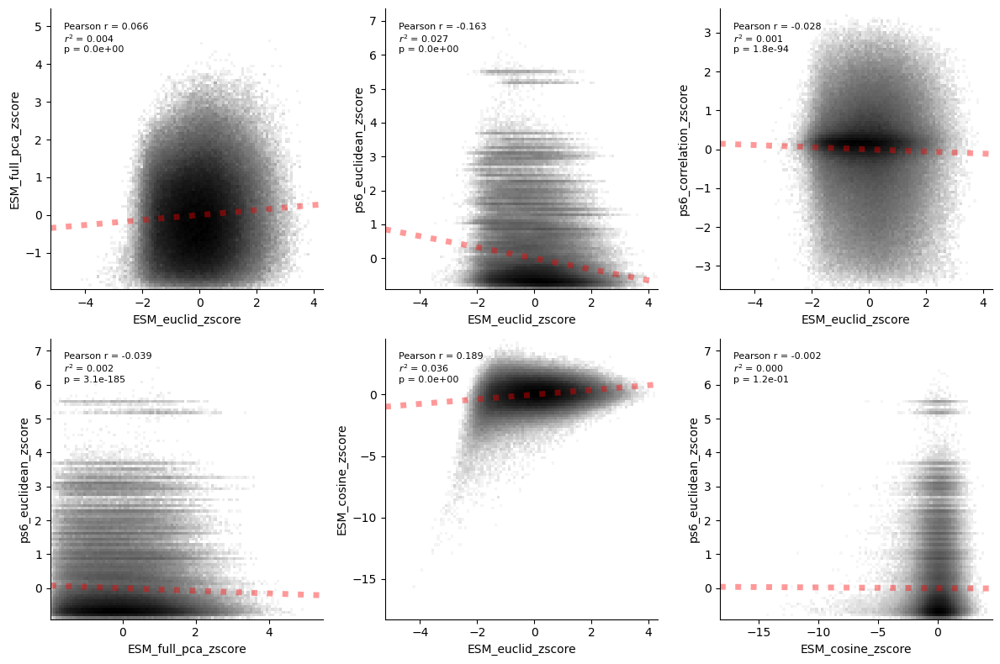

In [201]:
"""
comparing spatial ESM encoding correlation 
"""

fig, ax = pf.plt_correlation_subplots([[svd_distance['ESM_euclid_zscore'], svd_distance['ESM_full_pca_zscore']],
                                       [svd_distance['ESM_euclid_zscore'], svd_distance['ps6_euclidean_zscore']],
                                       [svd_distance['ESM_euclid_zscore'], svd_distance['ps6_correlation_zscore']], 
                                       [svd_distance['ESM_full_pca_zscore'], svd_distance['ps6_euclidean_zscore']], 
                                       [svd_distance['ESM_euclid_zscore'], svd_distance['ESM_cosine_zscore']], 
                                       [svd_distance['ESM_cosine_zscore'], svd_distance['ps6_euclidean_zscore']]], 
                                      xlabels = ['ESM_euclid_zscore','ESM_euclid_zscore', 'ESM_euclid_zscore', 'ESM_full_pca_zscore', 'ESM_euclid_zscore', 'ESM_cosine_zscore'], 
                                      ylabels = ['ESM_full_pca_zscore','ps6_euclidean_zscore', 'ps6_correlation_zscore', 'ps6_euclidean_zscore', 'ESM_cosine_zscore', 'ps6_euclidean_zscore'], 
                                      ncols=3, 
                                      linecolor = 'red', linewidth = 5, 
                                      linealpha=0.4, 
                                      opacity = 0.01, 
                                      plot_style = 'hist2d', 
                                      cmap='Greys', bins=100, 
                                      figsize_per_plot=[4,4], 
                                      pearson_fontsize = 8
                                      )
fig.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/corr_plots/spatialESM_ps6.png')

In [ ]:
"""
Plot all odors vs ESM sequence embedding euclidean distance

** Filtering for distance difference > 3 ** 

"""
plot_list = []
odor_list = []
for _odor in svd_distance.columns[8:]: 
    plot_list.append([svd_distance['ESM_full_pca_zscore'].values, 
                      svd_distance[_odor].values])
    odor_list.append(_odor)

fig, ax = pf.plt_correlation_subplots(plot_list, 
                                      xlabels = ['ESM_Distance_zscore']*len(plot_list), 
                                      ylabels = ['OR_logFC_adj_difference']*len(plot_list), 
                                      titles = odor_list, 
                                      ncols=4, 
                                      linecolor = 'red', linewidth = 5, 
                                      linealpha=0.4, 
                                      opacity = 0.01, 
                                      plot_style = 'hist2d', 
                                      cmap='Greys', bins=100, 
                                      figsize_per_plot=[3,3], 
                                      pearson_fontsize = 8
                                      )

fig.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/corr_plots/fullESMseq_ps6odor.png')


In [ ]:
"""
Plot all odors vs spatial ESM embedding euclidean distance 

"""
plot_list = []
odor_list = []
for i, _odor in enumerate(svd_distance.columns[8:]): 
    plot_list.append([svd_distance['ESM_Distance_zscore'].values, 
                      svd_distance[_odor].values])
    odor_list.append(_odor)
    
    
fig, ax = pf.plt_correlation_subplots(plot_list, 
                                      xlabels = ['ESM_Distance_zscore']*len(plot_list), 
                                      ylabels = ['OR_logFC_adj_difference']*len(plot_list), 
                                      titles = odor_list, 
                                      ncols=4, 
                                      plot_pearson_line = False, 
                                      linecolor = 'red', linewidth = 5, 
                                      linealpha=0.4, 
                                      opacity = 0.01, 
                                      plot_style = 'hist2d', 
                                      cmap='binary', bins=100, 
                                      figsize_per_plot=[4,4], 
                                      pearson_fontsize = 8, 
                                      log_scale=True
                                      )

fig.suptitle('OR_logFC_adj_difference', y = 1.01)

fig.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/corr_plots/spatialESM_ps6odor.png')

In [ ]:
"""
Plot all odors vs spatial ESM embedding euclidean distance 

** Filtering for distance difference > 3 ** 

"""
plot_list = []
odor_list = []
for i, _odor in enumerate(svd_distance.columns[8:]): 
    mask = svd_distance[_odor].values > 3
    plot_list.append([svd_distance['ESM_Distance_zscore'].values[mask], 
                      svd_distance[_odor].values[mask]])
    odor_list.append(_odor)
    # if i > 2: 
    #     break
    
fig, ax = pf.plt_correlation_subplots(plot_list, 
                                      xlabels = ['ESM_Distance_zscore']*len(plot_list), 
                                      ylabels = ['OR_logFC_adj_difference']*len(plot_list), 
                                      titles = odor_list, 
                                      ncols=4, 
                                    #   plot_pearson_line = False, 
                                      linecolor = 'red', linewidth = 5, 
                                      linealpha=0.4, 
                                      opacity = 0.01, 
                                      plot_style = 'hist2d', 
                                      cmap='binary', bins=100, 
                                      figsize_per_plot=[4,4], 
                                      pearson_fontsize = 8, 
                                      log_scale=True
                                      )
fig.suptitle('OR_logFC_adj_difference < 3', y = 1.01)

fig.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/corr_plots/spatialESM_ps6odor_filtered.png')


/mnt/data2/Justice/OR_learning/utils/plot_functions.py:694: ConstantInputWarning: An input array is constant; the correlation coefficient is not defined.
  slope, intercept, *_ = linregress(values1, values2)


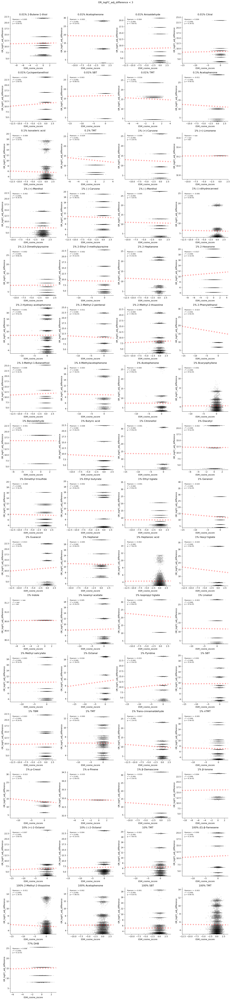

In [202]:
"""
Plot all odors vs spatial ESM embedding euclidean distance 

** Filtering for distance difference > 3 ** 

"""
plot_list = []
odor_list = []
for i, _odor in enumerate(svd_distance.columns[8:]): 
    mask = svd_distance[_odor].values > 3
    plot_list.append([svd_distance['ESM_cosine_zscore'].values[mask], 
                      svd_distance[_odor].values[mask]])
    odor_list.append(_odor)
    # if i > 2: 
    #     break
    
fig, ax = pf.plt_correlation_subplots(plot_list, 
                                      xlabels = ['ESM_cosine_zscore']*len(plot_list), 
                                      ylabels = ['OR_logFC_adj_difference']*len(plot_list), 
                                      titles = odor_list, 
                                      ncols=4, 
                                    #   plot_pearson_line = False, 
                                      linecolor = 'red', linewidth = 5, 
                                      linealpha=0.4, 
                                      opacity = 0.01, 
                                      plot_style = 'hist2d', 
                                      cmap='binary', bins=100, 
                                      figsize_per_plot=[4,4], 
                                      pearson_fontsize = 8, 
                                      log_scale=True
                                      )
fig.suptitle('OR_logFC_adj_difference < 3', y = 1.01)

fig.savefig('/mnt/data2/Justice/OR_learning/output/Canonical_bc/spatial_encoding/SVD_esm/corr_plots/spatialESM_cosine_ps6odor_filtered.png')


#### Chord OR ligand response

In [ ]:
plot_df = svd_distance[['OR1', 'OR2', 'ESM_Distance_zscore']]
plot_df = plot_df[np.abs(plot_df.ESM_Distance_zscore) > 2]

In [4]:
ps6_df = pd.read_csv('/mnt/data2/Justice/OR_learning/files/pS6IP/pS6IP_MASTER_HL_Annotated_2025.csv', index_col = 0)
ps6_df = ps6_df[['DL_OR', 'cid', 'odor', 'concentration', 'odor_and_conc', 'odor_category', 'logFC', 'FDR', 'logFC_adj_zscore']]
# Subset for concentration in percentages 
ps6_df = ps6_df[ps6_df.concentration.str.contains('p')]
# Quick sort to make plots group by odor category etc. 
ps6_df = ps6_df[['DL_OR', 'odor_and_conc', 'logFC_adj_zscore']].dropna()

In [ ]:
"""
# TODO NOT COMPLETE... Redundant to heatmap in some sense. 
However, the idea is to be visually more distinct in capturing similarity relationships within groups 
"""

import re 
from collections import defaultdict


# Your input dataframe
plot_df = svd_distance[['OR1', 'OR2', 'ESM_Distance_zscore']]
plot_df = plot_df[np.abs(plot_df.ESM_Distance_zscore) > 3]
# plot_df = plot_df[plot_df.ESM_Distance_zscore < -2.5]

# List of all ORs involved in edges
all_ors = pd.unique(svd_distance[['OR1', 'OR2']].values.ravel())

# Compute interaction score count for each OR
interaction_counts = defaultdict(int)
for or1, or2 in zip(plot_df['OR1'], plot_df['OR2']):
    interaction_counts[or1] += 1
    interaction_counts[or2] += 1

# Assign each OR to a family and prepare for sorting
or_family_map = {OR: int(re.match(r'Or(\d+)', OR).group(1)) for OR in all_ors}

# Group ORs by family
family_to_ors = defaultdict(list)
for OR in all_ors:
    family_to_ors[or_family_map[OR]].append(OR)

# Sort ORs: families ascending, then by interaction count descending, then alphabetically
sorted_ors = []
for family in sorted(family_to_ors):
    ors = family_to_ors[family]
    ors.sort(key=lambda or_id: (-interaction_counts[or_id], or_id))
    sorted_ors.extend(ors)

# Now assign angles based on sorted_ors
ORs = sorted_ors
n = len(ORs)
angle_map = {or_id: i * 2 * np.pi / n for i, or_id in enumerate(ORs)}

# Node coordinates on circle
radius = 1
node_pos = {or_id: (radius * np.cos(angle), -radius * np.sin(angle)) 
            for or_id, angle in angle_map.items()}

# Create figure
fig = go.Figure()

# Add inner family nodes
ORs_family = np.unique([int(re.match(r'Or(\d+)', _OR).group(1)) for _OR in ORs])
family_colors = cf.distinct_colors(ORs_family, category='tab20')
for _family in ORs_family:
    ORs_subset = [_OR for _OR in node_pos if int(re.match(r'Or(\d+)', _OR).group(1)) == _family]
    fig.add_trace(go.Scatter(
        x=[node_pos[or_id][0] for or_id in ORs_subset],
        y=[node_pos[or_id][1] for or_id in ORs_subset],
        # text=ors,
        mode='markers+text',
        # textposition='top center',
        marker=dict(size=8, color=family_colors[_family]),
        hovertext=ORs_subset
    ))
    

def bezier_curve(x0, y0, x1, y1, curvature=0.2, steps=20):
    # Midpoint
    mx, my = (x0 + x1) / 2, (y0 + y1) / 2
    # Direction vector from midpoint to origin (circle center)
    dx, dy = -mx, -my
    # Normalize and scale to curvature
    length = np.sqrt(dx**2 + dy**2)
    if length == 0:
        dx, dy = 0, 0
    else:
        dx, dy = dx / length * curvature, dy / length * curvature
    # Control point moved toward center
    cx, cy = mx + dx, my + dy
    # Quadratic Bézier curve
    t = np.linspace(0, 1, steps)
    bez_x = (1 - t)**2 * x0 + 2 * (1 - t) * t * cx + t**2 * x1
    bez_y = (1 - t)**2 * y0 + 2 * (1 - t) * t * cy + t**2 * y1
    return bez_x, bez_y

# Add curved edges
for _, row in plot_df.iterrows():
    or1, or2, score = row['OR1'], row['OR2'], row['ESM_Distance_zscore']
    x0, y0 = node_pos[or1]
    x1, y1 = node_pos[or2]
    # Draw curve line unless the distance is big
    if np.sqrt((x0 - x1)**2 + (y0 - y1)**2) < 1.8: 
        cx, cy = bezier_curve(x0, y0, x1, y1, curvature=0.5)
    else: 
        cx, cy = [x0, x1], [y0, y1]
    fig.add_trace(go.Scatter(
        x=cx,
        y=cy,
        mode='lines',
        opacity = 0.1, 
        line=dict(color= cf.mcolors.to_hex(cf.cm.get_cmap('RdBu')(0)) if score > 0 else cf.mcolors.to_hex(cf.cm.get_cmap('RdBu')(1000)), 
                  width=np.abs(score)),  
        hoverinfo='none',
        showlegend=False
    ))

# Layout
fig.update_layout(
    title="Curved Chord Plot of OR Pairwise ESM Z-scores",
    xaxis=dict(visible=False),
    yaxis=dict(visible=False),
    plot_bgcolor='white',
    margin=dict(l=20, r=20, t=40, b=20),
    showlegend=False, 
    height = 700, width = 700
)
fig.show()

### Spatial encoded PCA (OLD)

In [ ]:
import importlib 

importlib.reload(bc)
importlib.reload(pf)
importlib.reload(sa)
importlib.reload(pu)
importlib.reload(cf)
importlib.reload(vf)


<module 'voxel_functions' from '/mnt/data2/Justice/OR_learning/utils/voxel_functions.py'>

In [ ]:
Cbc_cav_coords  = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/pS6_screen/dict_pS6_screen_CBC_cav_coords.pkl')
Cbc_res_coords  = pd.read_pickle('/mnt/data2/Justice/OR_learning/files/pS6_screen/dict_pS6_screen_CBC_res_coords.pkl')

In [ ]:
"""
TESTING OF DIFFERENT SPATIAL PCA . . . 
"""

voxelized_4D_arrays, voxel_shape = vf.voxelize_cavity(
    # cavity_coords = list(Cbc_cav_coords.values()),
    residue_coords = list(Cbc_res_coords.values()),
    resolution = 1 )
voxelized_3Dlabeled_arrays = np.array([vf.convert_properties(voxel) for voxel in voxelized_4D_arrays])

# Compare all methods to find which works best for your data
results = compare_encoding_methods(voxelized_4D_arrays, use_labeled=False)


Applying kmer encoding...
Applying weighted encoding...
Applying fourier encoding...
Applying spherical encoding...


In [ ]:
list(Cbc_res_coords.values())[0]

In [ ]:
temp, _ = vf.voxelize_cavity(
    residue_coords = list(Cbc_res_coords.values()),
    resolution = 1 )

temp2 = np.array([vf.convert_properties(voxel) for voxel in temp])

In [ ]:
print(temp[0][28][13][10:12])
print(property_preserving_smoothing(temp2[0], sigma=0.5, use_labeled=True)[28][13][10:12])

[[0 0 0 0 0 0 0]
 [0 1 0 0 0 0 0]]
[[0.0000000e+00 7.4798726e-02 0.0000000e+00 0.0000000e+00 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [0.0000000e+00 4.8804381e-01 0.0000000e+00 2.2093704e-05 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


In [ ]:
property_preserving_smoothing(temp2[0], sigma=0.13, use_labeled=True)

In [ ]:
print(temp[0][7][14][7].astype(float))
print(list(gaussian_blur_properties(temp[0], sigma=0.2))[7][14][7])

[0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]
[0. 0. 0. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 0.]


In [ ]:
# fig = pf.visualize_voxel_grid([temp[0], property_preserving_smoothing(temp2[0], sigma=1, use_labeled=True)], 
#                         voxel_type = '4D', 
#                         labels = ['test1', 'test2'], 
#                         opacity = 0.3,
#                         property_indices=[ 1,  2,  3,  4,  5]
#                         )
fig = pf.visualize_voxel_grid([temp[0],
                         gaussian_blur_properties(temp[0], sigma=0.2)], 
                        voxel_type = '4D', 
                        labels = ['original', 'gaussian_blurred'], 
                        opacity = 0.5,
                        property_indices=[ 1,2,3,4],
                        colormap=cf.distinct_colors(num_colors=10)
                        )
# fig.add_traces(fig_blurr.data)
fig.show()
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/misc/Gaussian_blurr_voxel.html')

In [ ]:
data = []
data.append(fourier_transform_voxel(temp[0], freq_cutoff=5))
data.append(fourier_transform_voxel(gaussian_blur_properties(temp[0], sigma=0.12), freq_cutoff=5))
data.append(fourier_transform_voxel(gaussian_blur_properties(temp[0], sigma=1), freq_cutoff=5))
# data.append(fourier_transform_voxel(temp[-3], freq_cutoff=5))
# data.append(fourier_transform_voxel(gaussian_blur_properties(temp[-3], sigma=1), freq_cutoff=5))

names = ['temp1', 'temp1_blurred', 'temp2', 'temp2_blurred']

fig = go.Figure()
for i in range(len(data)):
    fig.add_traces(
        go.Scatter(x = list(range(len(data[0]))),
                   y = data[i], 
                   name = names[i]
                #    marker=dict(opacity=0.5)
                )
    )
fig.update_traces(opacity=0.5)
fig.show()

In [ ]:
importlib.reload(bc)
importlib.reload(pf)
importlib.reload(sa)
importlib.reload(pu)
importlib.reload(cf)
importlib.reload(vf)


<module 'voxel_functions' from '/mnt/data2/Justice/OR_learning/utils/voxel_functions.py'>

In [ ]:
voxelized_array, voxel_shape = vf.voxelize_cavity(
    residue_coords=Cbc_res_coords,
    resolution=1
)

# Convert voxel properties
# labeled_voxels = np.array([vf.convert_properties(voxel) for voxel in voxelized_array])

In [ ]:
import numpy as np
from scipy.ndimage import gaussian_filter
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA

def gaussian_blur_properties(voxel_data, sigma=0.8, preserve_originals=True):
    """
    Apply Gaussian blur to each property channel separately without intermixing properties.
    
    Parameters:
    -----------
    voxel_data : 4D array (x, y, z, properties)
        One-hot encoded voxel data
    sigma : float or sequence of floats
        Standard deviation for Gaussian kernel
    preserve_originals : bool
        If True, original non-zero values remain unchanged
        
    Returns:
    --------
    blurred_voxel : 4D array
        Blurred voxel with the same shape as input
    """
    x_size, y_size, z_size, n_properties = voxel_data.shape
    blurred_voxel = np.zeros_like(voxel_data, dtype=np.float32)
    
    # Process each property channel separately
    for prop_idx in range(n_properties):
        prop_data = voxel_data[:, :, :, prop_idx]
        
        # Find original non-zero positions if we need to preserve them
        if preserve_originals:
            original_positions = prop_data > 0
        
        # Apply Gaussian blur to this property
        blurred_prop = gaussian_filter(prop_data.astype(np.float32), sigma=sigma)
        
        # If requested, preserve original values
        if preserve_originals:
            blurred_prop[original_positions] = prop_data[original_positions]
        
        # Store the blurred property
        blurred_voxel[:, :, :, prop_idx] = blurred_prop
    
    return blurred_voxel

def fourier_transform_voxel(voxel_data, freq_cutoff=3):
    """
    Apply 3D Fourier transform to extract spatial patterns from voxel data.
    
    Parameters:
    -----------
    voxel_data : 4D array (x, y, z, properties)
        Voxel data (can be blurred)
    freq_cutoff : int
        Maximum frequency to retain in the Fourier transform
        
    Returns:
    --------
    features : array
        Fourier-encoded features
    """
    x_size, y_size, z_size, n_properties = voxel_data.shape
    features = []
    
    # Apply 3D FFT to each property channel
    for prop in range(n_properties):
        prop_data = voxel_data[:, :, :, prop]
        
        # Compute 3D FFT
        fft_data = np.fft.fftn(prop_data)
        
        # Shift zero frequency to center
        fft_shifted = np.fft.fftshift(fft_data)
        
        # Get center indices
        center_x, center_y, center_z = x_size // 2, y_size // 2, z_size // 2
        
        # Extract magnitudes of low frequency components
        # These capture the overall spatial patterns
        for i in range(-freq_cutoff, freq_cutoff + 1):
            for j in range(-freq_cutoff, freq_cutoff + 1):
                for k in range(-freq_cutoff, freq_cutoff + 1):
                    if abs(i) + abs(j) + abs(k) <= freq_cutoff:  # Focus on lower frequencies
                        # Get FFT magnitude at this frequency
                        freq_i = center_x + i
                        freq_j = center_y + j
                        freq_k = center_z + k
                        
                        # Make sure the indices are within bounds
                        if (0 <= freq_i < x_size and 
                            0 <= freq_j < y_size and 
                            0 <= freq_k < z_size):
                            features.append(np.abs(fft_shifted[freq_i, freq_j, freq_k]))
    
    return np.array(features)

def blur_fourier_encode_voxels(voxels, sigma=0.8, preserve_originals=True, freq_cutoff=3):
    """
    Complete pipeline: blur, Fourier transform, and encoding for voxel data.
    
    Parameters:
    -----------
    voxels : list of 4D arrays
        List of 4D voxel data arrays
    sigma : float
        Sigma parameter for Gaussian blur
    preserve_originals : bool
        Whether to preserve original non-zero values
    freq_cutoff : int
        Maximum frequency to include in Fourier features
        
    Returns:
    --------
    encoded_features : 2D array
        Encoded features for each voxel
    """
    encoded_features = []
    
    for voxel in voxels:
        # Apply Gaussian blur to each property channel
        blurred_voxel = gaussian_blur_properties(voxel, sigma=sigma, preserve_originals=preserve_originals)
        
        # Extract Fourier features
        features = fourier_transform_voxel(blurred_voxel, freq_cutoff=freq_cutoff)
        
        encoded_features.append(features)
    
    return np.array(encoded_features)

def visualize_blurred_voxel(original_voxel, blurred_voxel, property_idx=1, slice_idx=None):
    """
    Visualize the effect of blurring on a specific property and slice.
    
    Parameters:
    -----------
    original_voxel : 4D array
        Original voxel data
    blurred_voxel : 4D array
        Blurred voxel data
    property_idx : int
        Index of the property to visualize
    slice_idx : int or None
        Index of the slice to visualize (if None, use middle slice)
    """
    x_size, y_size, z_size, _ = original_voxel.shape
    
    if slice_idx is None:
        slice_idx = z_size // 2
    
    # Extract the specified property and slice
    original_slice = original_voxel[:, :, slice_idx, property_idx]
    blurred_slice = blurred_voxel[:, :, slice_idx, property_idx]
    
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))
    
    im1 = ax1.imshow(original_slice, cmap='viridis')
    ax1.set_title(f'Original - Property {property_idx}, Slice {slice_idx}')
    plt.colorbar(im1, ax=ax1)
    
    im2 = ax2.imshow(blurred_slice, cmap='viridis')
    ax2.set_title(f'Blurred - Property {property_idx}, Slice {slice_idx}')
    plt.colorbar(im2, ax=ax2)
    
    plt.tight_layout()
    # return 

def fourier_pca_analysis(voxels, sigma=0.8, preserve_originals=True, freq_cutoff=3, n_components=2):
    """
    Apply the full pipeline: blur, Fourier transform, and PCA to voxel data.
    
    Parameters:
    -----------
    voxels : list of 4D arrays
        List of 4D voxel data arrays
    sigma : float
        Sigma parameter for Gaussian blur
    preserve_originals : bool
        Whether to preserve original non-zero values
    freq_cutoff : int
        Maximum frequency to include in Fourier features
    n_components : int
        Number of PCA components to extract
        
    Returns:
    --------
    transformed_data : 2D array
        PCA-transformed data
    pca : PCA object
        Fitted PCA model
    encoded_features : 2D array
        Encoded features for each voxel
    """
    # Apply blur and Fourier encoding
    encoded_features = blur_fourier_encode_voxels(
        voxels, sigma=sigma, preserve_originals=preserve_originals, freq_cutoff=freq_cutoff
    )
    
    # Apply PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(encoded_features)
    
    return transformed_data, pca, encoded_features

def evaluate_sigma_values(voxels, sigmas=[0.5, 0.8, 1.0, 1.5, 2.0], n_components=2):
    """
    Evaluate different sigma values for the blur step.
    
    Parameters:
    -----------
    voxels : list of 4D arrays
        List of 4D voxel data arrays
    sigmas : list of float
        Sigma values to evaluate
    n_components : int
        Number of PCA components to extract
        
    Returns:
    --------
    results : dict
        Results for each sigma value
    """
    results = {}
    
    plt.figure(figsize=(15, 10))
    
    for i, sigma in enumerate(sigmas):
        # Apply pipeline
        transformed_data, pca, _ = fourier_pca_analysis(
            voxels, sigma=sigma, n_components=n_components
        )
        
        # Store results
        results[sigma] = {
            'transformed_data': transformed_data,
            'explained_variance': pca.explained_variance_ratio_
        }
        
        # Plot
        plt.subplot(2, 3, i+1)
        plt.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.7)
        plt.title(f'Sigma = {sigma}\nVar: {pca.explained_variance_ratio_[0]:.2f}, {pca.explained_variance_ratio_[1]:.2f}')
        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    # plt.savefig('sigma_comparison.png')
    # plt.close()
    
    return results

# Example pipeline for demonstration
def example_usage():
    # Create example 4D voxel data
    voxel_shape = (10, 10, 10, 7)  # x, y, z, properties (7 properties as you mentioned)
    n_samples = 5
    
    # Generate synthetic voxels for demonstration
    np.random.seed(42)
    voxels = []
    for _ in range(n_samples):
        voxel = np.zeros(voxel_shape)
        
        # Add some random active sites for each property
        for prop in range(1, 7):  # Properties 1-6 (skipping 0)
            num_sites = np.random.randint(3, 10)
            for _ in range(num_sites):
                x, y, z = np.random.randint(0, 10, size=3)
                voxel[x, y, z, prop] = 1
        
        voxels.append(voxel)
    
    # Demonstrate the blur effect
    voxel = voxels[0]
    blurred_voxel = gaussian_blur_properties(voxel, sigma=0.8)
    
    # Visualize for the first property and middle slice
    visualize_blurred_voxel(voxel, blurred_voxel, property_idx=1)
    
    # Complete pipeline with PCA
    transformed_data, pca, encoded_features = fourier_pca_analysis(voxels)
    
    print(f"Shape of encoded features: {encoded_features.shape}")
    print(f"Shape of transformed data: {transformed_data.shape}")
    print(f"Explained variance ratios: {pca.explained_variance_ratio_}")
    
    # Evaluate different sigma values
    results = evaluate_sigma_values(voxels)
    
    return transformed_data, encoded_features, results

In [ ]:
from scipy.ndimage import gaussian_filter

print(temp2[0][11][25])
print(gaussian_filter(temp2[0], sigma=1)[11][25])

[-1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  2  2  2 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1]
[-1  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0
  0  0  0  0  0 -1 -1 -1 -1 -1 -1 -1]


In [ ]:

pf.visualize_voxel_grid([temp[0]], 
                        labels = ['original', 'uniform_filtered'], 
                        colormap = ['blue', 'green']
                        )

In [ ]:
fig = go.Figure()

fig.add_traces(
    go.Scatter3d(
        x = temp[:,0],
        y = temp[:,1],
        z = temp[:,2],
    )
)
fig.show()

In [ ]:
from plotly.subplots import make_subplots


# Visualize the results
pS6_OR = pd.read_csv('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/or_screen.csv', 
                        index_col = 0)

    
# Create a 2x2 subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=list(results.keys()))
row_idx = 1
col_idx = 1
for _method in results:
    # Merge pS6 information to pca_df 
    pca_df = pd.DataFrame(results[_method]['transformed_data'], 
                          columns=[f'PCA_{i+1}' for i in range(2)], index=list(Cbc_res_coords.keys()))
    pca_df = pca_df.reset_index().rename(columns={'index': 'or_cid'})

    plot_data = pd.merge(pca_df, pS6_OR, on='or_cid')
    plot_data['cid'] = plot_data['cid'].astype(str)

    colormap = cf.distinct_colors(plot_data['DL_OR'].unique(), category='tab20')
    shape_dict = {_cid:['circle', 'square', 'triangle-up', 'x', 'diamond'][i] for i, _cid in enumerate(plot_data['cid'].unique())}

    # Loop through groups to add traces to the subplot
    for (_OR, _cid), subset in plot_data.groupby(["DL_OR", "cid"]):
        trace_name = f"{_OR}_{_cid}"  # Unique name for each trace
        fig.add_trace(
            go.Scatter(
                x=subset['PCA_1'],
                y=subset['PCA_2'],
                name=trace_name,
                marker=dict(
                    color=colormap[_OR], 
                    size=15 if subset.FDR.values[0] < 0.05 else 5, 
                    symbol=shape_dict[_cid], 
                    opacity=0.7
                ),
                hovertemplate=f'{_OR}<br>{subset.odor.values[0]}<br>logFC: {subset.logFC.values[0]:.2f}<br>FDR: {subset.FDR.values[0]:.2e}',
                mode='markers',
                legendgroup=_OR,
                # Only show in legend for first subplot to avoid duplicates
                showlegend=(row_idx == 1 and col_idx == 1)
            ),
            row=row_idx, col=col_idx
        )
    
    # Update axes labels for each subplot
    fig.update_xaxes(title_text=f"PCA_1 ({100*results[_method]['explained_variance'][0]:.3f}%)", row=row_idx, col=col_idx)
    fig.update_yaxes(title_text=f"PCA_2 ({100*results[_method]['explained_variance'][1]:.3f}%)", row=row_idx, col=col_idx)
    
    # Move to next subplot position
    col_idx += 1
    if col_idx > 2:
        col_idx = 1
        row_idx += 1

# Update layout for the entire figure
fig.update_layout(
    # height=800,  # Adjust height as needed
    # width=1000,  # Adjust width as needed
    template='simple_white',
    title_text="PCA Plots AF3 structure encoding method Comparison",
    legend_title_text="DL_OR_cid"
)

fig.show()
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/PCA_encoding_method_cav_res.html')
fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/PCA_encoding_method_res.html')

In [ ]:
from plotly.subplots import make_subplots


# Visualize the results
pS6_OR = pd.read_csv('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/or_screen.csv', 
                        index_col = 0)

    
# Create a 2x2 subplot figure
fig = make_subplots(rows=2, cols=2, subplot_titles=list(results.keys()))
row_idx = 1
col_idx = 1
for _method in results:
    # Merge pS6 information to pca_df 
    pca_df = pd.DataFrame(results[_method]['transformed_data'], 
                          columns=[f'PCA_{i+1}' for i in range(2)], index=list(Cbc_res_coords.keys()))
    pca_df = pca_df.reset_index().rename(columns={'index': 'or_cid'})

    plot_data = pd.merge(pca_df, pS6_OR, on='or_cid')
    plot_data['cid'] = plot_data['cid'].astype(str)

    colormap = cf.distinct_colors(plot_data['DL_OR'].unique(), category='tab20')
    shape_dict = {_cid:['circle', 'square', 'triangle-up', 'x', 'diamond'][i] for i, _cid in enumerate(plot_data['cid'].unique())}

    # Loop through groups to add traces to the subplot
    for (_OR, _cid), subset in plot_data.groupby(["DL_OR", "cid"]):
        trace_name = f"{_OR}_{_cid}"  # Unique name for each trace
        fig.add_trace(
            go.Scatter(
                x=subset['PCA_1'],
                y=subset['PCA_2'],
                name=trace_name,
                marker=dict(
                    color=colormap[_OR], 
                    size=15 if subset.FDR.values[0] < 0.05 else 5, 
                    symbol=shape_dict[_cid], 
                    opacity=0.7
                ),
                hovertemplate=f'{_OR}<br>{subset.odor.values[0]}<br>logFC: {subset.logFC.values[0]:.2f}<br>FDR: {subset.FDR.values[0]:.2e}',
                mode='markers',
                legendgroup=_OR,
                # Only show in legend for first subplot to avoid duplicates
                showlegend=(row_idx == 1 and col_idx == 1)
            ),
            row=row_idx, col=col_idx
        )
    
    # Update axes labels for each subplot
    fig.update_xaxes(title_text=f"PCA_1 ({100*results[_method]['explained_variance'][0]:.3f}%)", row=row_idx, col=col_idx)
    fig.update_yaxes(title_text=f"PCA_2 ({100*results[_method]['explained_variance'][1]:.3f}%)", row=row_idx, col=col_idx)
    
    # Move to next subplot position
    col_idx += 1
    if col_idx > 2:
        col_idx = 1
        row_idx += 1

# Update layout for the entire figure
fig.update_layout(
    # height=800,  # Adjust height as needed
    # width=1000,  # Adjust width as needed
    template='simple_white',
    title_text="PCA Plots AF3 structure encoding method Comparison",
    legend_title_text="DL_OR_cid"
)

fig.show()
# fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/PCA_encoding_method_cav_res.html')
fig.write_html('/mnt/data2/Justice/OR_learning/output/Canonical_bc/AF3/pS6_screen/PCA_encoding_method_res.html')

In [ ]:
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
from scipy.ndimage import uniform_filter

def create_3d_kmers(voxel_data, kmer_size=3, stride=1, use_labeled=True):
    """
    Create 3D k-mers (cubic neighborhoods) from voxel data
    
    Parameters:
    -----------
    voxel_data : 3D or 4D array
        Either labeled voxels (3D array with integers) or 
        one-hot encoded voxels (4D array with binary values)
    kmer_size : int
        Size of cubic neighborhood (k×k×k)
    stride : int
        Step size when moving the kmer window
    use_labeled : bool
        If True, assumes voxel_data is a 3D array with integer labels
        If False, assumes voxel_data is a 4D array with one-hot encoding
        
    Returns:
    --------
    features : array
        Flattened k-mer features
    """
    if use_labeled:
        # 3D array with integer labels
        x_size, y_size, z_size = voxel_data.shape
        n_properties = 8  # Assuming 0-7 property classes
    else:
        # 4D array with one-hot encoding
        x_size, y_size, z_size, n_properties = voxel_data.shape
    
    # Calculate output dimensions
    x_out = (x_size - kmer_size) // stride + 1
    y_out = (y_size - kmer_size) // stride + 1
    z_out = (z_size - kmer_size) // stride + 1
    
    # Initialize feature vector
    feature_size = x_out * y_out * z_out * (kmer_size**3) * (1 if use_labeled else n_properties)
    features = np.zeros(feature_size)
    
    idx = 0
    # Iterate over all possible kmer positions with stride
    for i in range(0, x_size - kmer_size + 1, stride):
        for j in range(0, y_size - kmer_size + 1, stride):
            for k in range(0, z_size - kmer_size + 1, stride):
                # Extract the k×k×k neighborhood
                if use_labeled:
                    kmer = voxel_data[i:i+kmer_size, j:j+kmer_size, k:k+kmer_size]
                    # Flatten the kmer
                    features[idx:idx+kmer.size] = kmer.flatten()
                    idx += kmer.size
                else:
                    kmer = voxel_data[i:i+kmer_size, j:j+kmer_size, k:k+kmer_size, :]
                    # Flatten the kmer
                    features[idx:idx+kmer.size] = kmer.flatten()
                    idx += kmer.size
    
    return features

def weighted_spatial_encoding(voxel_data, use_labeled=True, radius=2):
    """
    Create a weighted spatial encoding where each position is influenced by its neighbors
    
    Parameters:
    -----------
    voxel_data : 3D or 4D array
        Either labeled voxels (3D with integers) or one-hot encoded (4D)
    use_labeled : bool
        If True, assumes voxel_data is a 3D array with integer labels (0-7)
        If False, assumes voxel_data is a 4D array with one-hot encoding
    radius : int
        Neighborhood radius to consider for spatial weights
        
    Returns:
    --------
    encoded_data : array
        Spatially encoded features
    """
    if use_labeled:
        # Convert labeled data to one-hot encoding
        x_size, y_size, z_size = voxel_data.shape
        n_properties = 8  # Assuming 0-7 property classes
        one_hot = np.zeros((x_size, y_size, z_size, n_properties), dtype=np.float32)
        
        for i in range(x_size):
            for j in range(y_size):
                for k in range(z_size):
                    prop_idx = voxel_data[i, j, k]
                    if 0 <= prop_idx < n_properties:
                        one_hot[i, j, k, prop_idx] = 1.0
        
        data = one_hot
    else:
        data = voxel_data.copy().astype(np.float32)
    
    x_size, y_size, z_size, n_properties = data.shape
    
    # Create spatially weighted features
    weighted_features = np.zeros_like(data)
    
    # Apply spatial averaging with different weights based on distance
    for prop in range(n_properties):
        prop_data = data[:, :, :, prop]
        
        # Create multiple weighted versions with different kernels/radii
        for r in range(1, radius + 1):
            # Use uniform filter with different sizes to approximate weighted neighborhoods
            weight = 1.0 / (r * 2)
            smoothed = uniform_filter(prop_data, size=r*2-1) * weight
            weighted_features[:, :, :, prop] += smoothed
        
        # Add the original data with higher weight
        weighted_features[:, :, :, prop] += prop_data * 0.5
    
    # Flatten while preserving some spatial structure
    # We'll divide the volume into regions and compute statistics
    region_size = max(2, min(x_size, y_size, z_size) // 4)
    
    encoded_features = []
    
    # Iterate over regions
    for i in range(0, x_size, region_size):
        i_end = min(i + region_size, x_size)
        for j in range(0, y_size, region_size):
            j_end = min(j + region_size, y_size)
            for k in range(0, z_size, region_size):
                k_end = min(k + region_size, z_size)
                
                # Extract region
                region = weighted_features[i:i_end, j:j_end, k:k_end, :]
                
                if region.size > 0:
                    # Calculate statistics for each property in this region
                    for prop in range(n_properties):
                        prop_data = region[:, :, :, prop]
                        
                        # Add various statistics
                        encoded_features.append(np.mean(prop_data))
                        encoded_features.append(np.sum(prop_data))
                        encoded_features.append(np.max(prop_data))
                        
                        # Count non-zero values (presence)
                        encoded_features.append(np.count_nonzero(prop_data))
                        
                        # Add spatial gradients (changes in x, y, z directions)
                        if prop_data.shape[0] > 1:
                            encoded_features.append(np.mean(np.diff(prop_data, axis=0)))
                        else:
                            encoded_features.append(0)
                            
                        if prop_data.shape[1] > 1:
                            encoded_features.append(np.mean(np.diff(prop_data, axis=1)))
                        else:
                            encoded_features.append(0)
                            
                        if prop_data.shape[2] > 1:
                            encoded_features.append(np.mean(np.diff(prop_data, axis=2)))
                        else:
                            encoded_features.append(0)
    
    return np.array(encoded_features)

def fourier_encoding(voxel_data, use_labeled=True, freq_cutoff=3):
    """
    Use 3D Fourier transform to capture spatial patterns in voxel data
    
    Parameters:
    -----------
    voxel_data : 3D or 4D array
        Either labeled voxels (3D with integers) or one-hot encoded (4D)
    use_labeled : bool
        If True, assumes voxel_data is a 3D array with integer labels
        If False, assumes voxel_data is a 4D array with one-hot encoding
    freq_cutoff : int
        Maximum frequency to retain in the Fourier transform
        
    Returns:
    --------
    features : array
        Fourier-encoded features
    """
    if use_labeled:
        # Convert labeled data to one-hot encoding
        x_size, y_size, z_size = voxel_data.shape
        n_properties = 8  # Assuming 0-7 property classes
        one_hot = np.zeros((x_size, y_size, z_size, n_properties), dtype=np.float32)
        
        for i in range(x_size):
            for j in range(y_size):
                for k in range(z_size):
                    prop_idx = voxel_data[i, j, k]
                    if 0 <= prop_idx < n_properties:
                        one_hot[i, j, k, prop_idx] = 1.0
        
        data = one_hot
    else:
        data = voxel_data.copy().astype(np.float32)
    
    x_size, y_size, z_size, n_properties = data.shape
    
    features = []
    
    # Apply 3D FFT to each property channel
    for prop in range(n_properties):
        prop_data = data[:, :, :, prop]
        
        # Compute 3D FFT
        fft_data = np.fft.fftn(prop_data)
        
        # Extract magnitudes of low frequency components
        # These capture the overall spatial patterns
        for i in range(-freq_cutoff, freq_cutoff + 1):
            for j in range(-freq_cutoff, freq_cutoff + 1):
                for k in range(-freq_cutoff, freq_cutoff + 1):
                    if abs(i) + abs(j) + abs(k) <= freq_cutoff:  # Focus on lower frequencies
                        # Get FFT magnitude at this frequency
                        freq_i = i % x_size
                        freq_j = j % y_size
                        freq_k = k % z_size
                        features.append(np.abs(fft_data[freq_i, freq_j, freq_k]))
    
    return np.array(features)

def spherical_harmonic_encoding(voxel_data, use_labeled=True, max_r=5, max_l=3):
    """
    Simple approximation of spherical harmonic encoding for voxel data
    
    Parameters:
    -----------
    voxel_data : 3D or 4D array
        Either labeled voxels (3D with integers) or one-hot encoded (4D)
    use_labeled : bool
        If True, assumes voxel_data is a 3D array with integer labels
        If False, assumes voxel_data is a 4D array with one-hot encoding
    max_r : int
        Maximum radius to consider for shells
    max_l : int
        Maximum order of spherical approximation
        
    Returns:
    --------
    features : array
        Encoded features
    """
    if use_labeled:
        # Convert labeled data to one-hot encoding
        x_size, y_size, z_size = voxel_data.shape
        n_properties = 8  # Assuming 0-7 property classes
        one_hot = np.zeros((x_size, y_size, z_size, n_properties), dtype=np.float32)
        
        for i in range(x_size):
            for j in range(y_size):
                for k in range(z_size):
                    prop_idx = voxel_data[i, j, k]
                    if 0 <= prop_idx < n_properties:
                        one_hot[i, j, k, prop_idx] = 1.0
        
        data = one_hot
    else:
        data = voxel_data.copy().astype(np.float32)
    
    x_size, y_size, z_size, n_properties = data.shape
    
    # Find the center of the voxel grid
    center_x, center_y, center_z = x_size // 2, y_size // 2, z_size // 2
    
    features = []
    
    # For each property, calculate features based on spherical shells
    for prop in range(n_properties):
        prop_data = data[:, :, :, prop]
        
        # For each radius, calculate shells
        for r in range(1, max_r + 1):
            shell_values = []
            
            # Collect values at approximate distance r from center
            for i in range(x_size):
                for j in range(y_size):
                    for k in range(z_size):
                        # Manhattan distance as approximation
                        dist = abs(i - center_x) + abs(j - center_y) + abs(k - center_z)
                        if r-1 <= dist <= r:
                            shell_values.append((prop_data[i, j, k], i, j, k))
            
            if shell_values:
                # Basic statistics for this shell
                values = [v[0] for v in shell_values]
                features.append(np.mean(values))
                features.append(np.sum(values))
                features.append(np.max(values))
                
                # Simple directional features (approximating spherical harmonics)
                for l in range(1, max_l + 1):
                    # For each order l, compute approximate directional components
                    if l == 1:  # First order - x, y, z directions
                        # X direction
                        x_pos = np.mean([v[0] for v in shell_values if v[1] > center_x])
                        x_neg = np.mean([v[0] for v in shell_values if v[1] < center_x])
                        features.append(x_pos - x_neg)
                        
                        # Y direction
                        y_pos = np.mean([v[0] for v in shell_values if v[2] > center_y])
                        y_neg = np.mean([v[0] for v in shell_values if v[2] < center_y])
                        features.append(y_pos - y_neg)
                        
                        # Z direction
                        z_pos = np.mean([v[0] for v in shell_values if v[3] > center_z])
                        z_neg = np.mean([v[0] for v in shell_values if v[3] < center_z])
                        features.append(z_pos - z_neg)
                    
                    elif l == 2:  # Second order - quadrants
                        # Compute averages in 8 octants
                        for x_dir in [-1, 1]:
                            for y_dir in [-1, 1]:
                                for z_dir in [-1, 1]:
                                    octant = [v[0] for v in shell_values if 
                                             (v[1] - center_x) * x_dir > 0 and
                                             (v[2] - center_y) * y_dir > 0 and
                                             (v[3] - center_z) * z_dir > 0]
                                    if octant:
                                        features.append(np.mean(octant))
                                    else:
                                        features.append(0)
                    
                    elif l == 3:  # Third order - more detailed patterns
                        # More detailed patterns could be added here
                        pass
    
    return np.array(features)

def spatial_pca_analysis(voxels, method='weighted', use_labeled=True, n_components=2):
    """
    Apply PCA to spatially encoded voxel data
    
    Parameters:
    -----------
    voxels : list of arrays
        List of voxel data (either 3D labeled or 4D one-hot encoded)
    method : str
        Encoding method: 'kmer', 'weighted', 'fourier', or 'spherical'
    use_labeled : bool
        Whether voxels are in labeled format (3D) or one-hot encoded (4D)
    n_components : int
        Number of principal components to extract
        
    Returns:
    --------
    transformed_data : array
        Data projected onto principal components
    pca : PCA object
        Fitted PCA model
    encoded_data : array
        Encoded feature vectors
    """
    # Apply selected encoding method
    encoded_data = []
    
    for voxel in voxels:
        if method == 'kmer':
            features = create_3d_kmers(voxel, kmer_size=3, stride=1, use_labeled=use_labeled)
        elif method == 'weighted':
            features = weighted_spatial_encoding(voxel, use_labeled=use_labeled, radius=2)
        elif method == 'fourier':
            features = fourier_encoding(voxel, use_labeled=use_labeled, freq_cutoff=3)
        elif method == 'spherical':
            features = spherical_harmonic_encoding(voxel, use_labeled=use_labeled, max_r=5, max_l=3)
        else:
            raise ValueError(f"Unknown method: {method}")
        
        encoded_data.append(features)
    
    # Convert to numpy array
    encoded_data = np.array(encoded_data)
    
    # Apply scaling before PCA
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(encoded_data)
    
    # Apply PCA
    pca = PCA(n_components=n_components)
    transformed_data = pca.fit_transform(scaled_data)
    
    return transformed_data, pca, encoded_data

# Example usage with visualization
def visualize_pca_results(transformed_data, labels=None, title="Spatial PCA Analysis"):
    """Visualize the PCA results with colored points by label if provided"""
    plt.figure(figsize=(10, 8))
    
    if labels is not None:
        unique_labels = np.unique(labels)
        colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))
        
        for i, label in enumerate(unique_labels):
            mask = labels == label
            plt.scatter(
                transformed_data[mask, 0],
                transformed_data[mask, 1],
                c=[colors[i]],
                label=f"Class {label}",
                alpha=0.7
            )
        plt.legend()
    else:
        plt.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.7)
        
    plt.title(title)
    plt.xlabel('Principal Component 1')
    plt.ylabel('Principal Component 2')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    
    return plt

# Example comparing methods
def compare_encoding_methods(voxels, labels=None, use_labeled=True):
    """Compare different spatial encoding methods"""
    methods = ['kmer', 'weighted', 'fourier', 'spherical']
    results = {}
    
    plt.figure(figsize=(16, 12))
    
    for i, method in enumerate(methods):
        print(f"Applying {method} encoding...")
        transformed_data, pca, _ = spatial_pca_analysis(
            voxels, method=method, use_labeled=use_labeled, n_components=2
        )
        
        results[method] = {
            'transformed_data': transformed_data,
            'explained_variance': pca.explained_variance_ratio_
        }
        
        plt.subplot(2, 2, i+1)
        if labels is not None:
            unique_labels = np.unique(labels)
            colors = plt.cm.tab10(np.linspace(0, 1, len(unique_labels)))
            
            for j, label in enumerate(unique_labels):
                mask = labels == label
                plt.scatter(
                    transformed_data[mask, 0],
                    transformed_data[mask, 1],
                    c=[colors[j]],
                    label=f"Class {label}",
                    alpha=0.7
                )
            if i == 0:  # Only show legend once
                plt.legend()
        else:
            plt.scatter(transformed_data[:, 0], transformed_data[:, 1], alpha=0.7)
            
        explained_var = pca.explained_variance_ratio_
        plt.title(f"{method.capitalize()} Encoding\nVar: {explained_var[0]:.2f}, {explained_var[1]:.2f}")
        plt.xlabel('PC1')
        plt.ylabel('PC2')
        plt.grid(True, linestyle='--', alpha=0.5)
    
    plt.tight_layout()
    plt.savefig('encoding_methods_comparison.png')
    plt.close()
    
    return results